# Librerías

In [1]:
# Sistema
import os
import json
import random
from pathlib import Path

# Manipulación de datos
import numpy as np
import pandas as pd

# Utilidades
from tqdm import tqdm

# Visualización estática
import matplotlib.pyplot as plt
import seaborn as sns

# Visualización interactiva
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

# Configuración de visualización
import cufflinks as cf
from sklearn import set_config

# Imputación
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Detección de outliers
from sklearn.ensemble import IsolationForest

# Preprocesamiento
from sklearn.preprocessing import MinMaxScaler

# Reducción de dimensionalidad
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Multicolinealidad
from varclushi import VarClusHi

# Clustering
from sklearn.cluster import KMeans  # DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

# Métricas
from sklearn.metrics import (
    davies_bouldin_score,
    silhouette_score
)

# Configuración del entorno
pio.renderers.default = "iframe"

cf.go_offline()

set_config(display='diagram')

pd.set_option('display.max_columns', 50)

# Funciones

In [2]:
def file_path(file: str) -> str:
    return os.path.join('data', file + '.json')

def read_file(file: str):
    
    def jnorm(x: pd.DataFrame):

        y = x.copy()
        
        values = pd.json_normalize(y['value'])
        values.index = y.index
        
        return values
                
    match file:
        case 'transcript':
            aux = pd.read_json(file_path(file), lines=True)
            
            offer_viewed = aux.query("event == 'offer viewed'").copy()
            offer_viewed['event_offer'] = jnorm(offer_viewed)['offer id']
            
            offer_received = aux.query("event == 'offer received'").copy()
            offer_received['event_offer'] = jnorm(offer_received)['offer id']
            
            transaction = aux.query("event == 'transaction'").copy()
            transaction['amount'] = jnorm(transaction)['amount']
            
            offer_completed = aux.query("event == 'offer completed'").copy()
            offer_completed[['event_offer', 'event_reward']] = jnorm(offer_completed)[['offer_id', 'reward']]

            return offer_viewed, offer_received, transaction, offer_completed
            
        case 'portfolio':
            return pd.read_json(file_path(file), lines=True).explode('channels')
            
        case 'profile':
            aux = pd.read_json(file_path(file), lines=True)
            aux['became_member_on'] = pd.to_datetime(aux['became_member_on'], format='%Y%m%d', errors='coerce')
            
            return aux

# Lectura

In [3]:
offer_viewed, offer_received, transaction, offer_completed = read_file('transcript')
portfolio = read_file('portfolio')
profile = read_file('profile')

In [4]:
display(offer_viewed.head(2))
display(offer_received.head(2))
display(transaction.head(2))
display(offer_completed.head(2))
display(portfolio.head(2))
display(profile.head(2))

,person,event,value,time,event_offer
12650,389bc3fa690240e798340f5a15918d5c,offer viewed,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},0,f19421c1d4aa40978ebb69ca19b0e20d
12651,d1ede868e29245ea91818a903fec04c6,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0,5a8bc65990b245e5a138643cd4eb9837


,person,event,value,time,event_offer
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0,9b98b8c7a33c4b65b9aebfe6a799e6d9
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0,0b1e1539f2cc45b7b9fa7c272da2e1d7


,person,event,value,time,amount
12654,02c083884c7d45b39cc68e1314fec56c,transaction,{'amount': 0.8300000000000001},0,0.83
12657,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,{'amount': 34.56},0,34.56


,person,event,value,time,event_offer,event_reward
12658,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,offer completed,{'offer_id': '2906b810c7d4411798c6938adc9daaa5...,0,2906b810c7d4411798c6938adc9daaa5,2
12672,fe97aa22dd3e48c8b143116a8403dd52,offer completed,{'offer_id': 'fafdcd668e3743c1bb461111dcafc2a4...,0,fafdcd668e3743c1bb461111dcafc2a4,2


,reward,channels,difficulty,duration,offer_type,id
0,10,email,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
0,10,mobile,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd


,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.0


# Ingeniería / Tratamiento

In [5]:
aux = offer_received.loc[:, ['person', 'time', 'event_offer']].merge(
    offer_viewed.loc[:, ['person', 'time', 'event_offer', 'event']],
    how='left',
    on=['person', 'event_offer']
)

aux.rename(
    columns={'time_x': 'time_received', 'time_y': 'time_reviewed'},
    inplace=True
)

aux['hrs_since_received'] = aux['time_reviewed'] - aux['time_received']

mask = aux['hrs_since_received'] < 0
aux.loc[mask, ['time_reviewed', 'event', 'hrs_since_received']] = np.nan

aux = (
    aux
    .sort_values(by=['person', 'time_received', 'hrs_since_received'])
    .drop_duplicates(
        subset=['person', 'event_offer', 'time_received'],
        keep='first'
    )
)

aux['offer_viewed'] = aux['event'].map(
    lambda x: 1 if x == 'offer viewed' else 0
)

aux.drop(columns=['event'], inplace=True)

aux = aux.merge(
    offer_completed.loc[:, ['person', 'time', 'event_offer', 'event', 'event_reward']],
    how='left',
    on=['person', 'event_offer']
)

aux.rename(columns={'time': 'time_completed'}, inplace=True)

base_time = np.where(
    aux['time_reviewed'].isna(),
    aux['time_received'],
    aux['time_reviewed']
)

mask = aux['time_completed'] < base_time

aux.loc[
    mask,
    ['time_completed', 'event', 'event_reward']
] = np.nan

aux = (
    aux
    .sort_values(by=['person', 'event_offer', 'time_received', 'time_completed'])
    .drop_duplicates(
        subset=['person', 'event_offer', 'time_received'],
        keep='first'
    )
)

base_time = np.where(
    aux['time_reviewed'].isna(),
    aux['time_received'],
    aux['time_reviewed']
)

aux['hrs_com_since_received'] = (
    aux['time_completed'] - aux['time_received']
)

aux['hrs_com_since_reviewed'] = (
    aux['time_completed'] - aux['time_reviewed']
)

aux['hrs_since_rev_or_rec'] = (
    aux['time_completed'] - base_time
)

aux['offer_completed'] = aux['event'].map(
    lambda x: 1 if x == 'offer completed' else 0
)

aux.drop(columns=['event'], inplace=True)

print(
    'Dimensión:', aux.shape,
    '\nDimensión de auxiliar = Dimensión de oferta recibida:',
    aux.shape[0] == offer_received.shape[0]
)

order_c = [
    'person', 'event_offer', 'offer_viewed', 'offer_completed',
    'time_received', 'time_reviewed', 'time_completed',
    'hrs_since_received', 'hrs_com_since_received', 'hrs_com_since_reviewed', 'hrs_since_rev_or_rec'
]
order_rest = [x for x in aux.columns if x not in order_c]

aux = aux.loc[:, order_c + order_rest]

#time_c = aux.filter(like='time', axis=1).columns.tolist()
#hrs_c = aux.filter(like='hrs', axis=1).columns.tolist()

#display(aux.loc[:, ['person'] + time_c + hrs_c].head(30))

display(aux.head(10))

Dimensión: (76277, 12) 
Dimensión de auxiliar = Dimensión de oferta recibida: True


,person,event_offer,offer_viewed,offer_completed,time_received,time_reviewed,time_completed,hrs_since_received,hrs_com_since_received,hrs_com_since_reviewed,hrs_since_rev_or_rec,event_reward
4,0009655768c64bdeb2e877511632db8f,2906b810c7d4411798c6938adc9daaa5,0,1,576,NaN,576.0,NaN,0.0,NaN,0.0,2.0
1,0009655768c64bdeb2e877511632db8f,3f207df678b143eea3cee63160fa8bed,1,0,336,372.0,NaN,36.0,NaN,NaN,NaN,NaN
0,0009655768c64bdeb2e877511632db8f,5a8bc65990b245e5a138643cd4eb9837,1,0,168,192.0,NaN,24.0,NaN,NaN,NaN,NaN
2,0009655768c64bdeb2e877511632db8f,f19421c1d4aa40978ebb69ca19b0e20d,1,0,408,456.0,NaN,48.0,NaN,NaN,NaN,NaN
3,0009655768c64bdeb2e877511632db8f,fafdcd668e3743c1bb461111dcafc2a4,1,0,504,540.0,NaN,36.0,NaN,NaN,NaN,NaN
5,00116118485d4dfda04fdbaba9a87b5c,f19421c1d4aa40978ebb69ca19b0e20d,1,0,168,216.0,NaN,48.0,NaN,NaN,NaN,NaN
6,00116118485d4dfda04fdbaba9a87b5c,f19421c1d4aa40978ebb69ca19b0e20d,1,0,576,630.0,NaN,54.0,NaN,NaN,NaN,NaN
10,0011e0d4e6b944f998e987f904e8c1e5,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,1,408,432.0,576.0,24.0,168.0,144.0,144.0,5.0
8,0011e0d4e6b944f998e987f904e8c1e5,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,168,186.0,252.0,18.0,84.0,66.0,66.0,3.0
7,0011e0d4e6b944f998e987f904e8c1e5,3f207df678b143eea3cee63160fa8bed,1,0,0,6.0,NaN,6.0,NaN,NaN,NaN,NaN


In [6]:
portfolio_t = (
    portfolio
    .assign(value=1)
    .pivot_table(
        index=[
            'reward',
            'difficulty',
            'duration',
            'offer_type',
            'id'
        ],
        columns='channels',
        values='value',
        fill_value=0
    )
    .reset_index()
)

offer_dummies = pd.get_dummies(
    portfolio_t['offer_type'],
    dtype=int
)

portfolio_t = pd.concat(
    [portfolio_t, offer_dummies],
    axis=1
)

In [7]:
portfolio_t

,reward,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,0,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,0,0,1
1,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1.0,1.0,0.0,1.0,0,0,1
2,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,0,1,0
3,2,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,0,1,0
4,3,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1.0,1.0,1.0,1.0,0,1,0
5,5,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,1,0,0
6,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,1,0,0
7,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,0,1,0
8,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,1,0,0
9,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,1,0,0


In [8]:
table_offers = aux.merge(
    portfolio_t,
    how='left',
    left_on='event_offer',
    right_on='id'
).drop(columns=['id', 'event_reward'])

In [9]:
table_offers.head(10)

,person,event_offer,offer_viewed,offer_completed,time_received,time_reviewed,time_completed,hrs_since_received,hrs_com_since_received,hrs_com_since_reviewed,hrs_since_rev_or_rec,reward,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
0,0009655768c64bdeb2e877511632db8f,2906b810c7d4411798c6938adc9daaa5,0,1,576,NaN,576.0,NaN,0.0,NaN,0.0,2,10,7,discount,1.0,1.0,0.0,1.0,0,1,0
1,0009655768c64bdeb2e877511632db8f,3f207df678b143eea3cee63160fa8bed,1,0,336,372.0,NaN,36.0,NaN,NaN,NaN,0,0,4,informational,1.0,1.0,0.0,1.0,0,0,1
2,0009655768c64bdeb2e877511632db8f,5a8bc65990b245e5a138643cd4eb9837,1,0,168,192.0,NaN,24.0,NaN,NaN,NaN,0,0,3,informational,1.0,1.0,1.0,0.0,0,0,1
3,0009655768c64bdeb2e877511632db8f,f19421c1d4aa40978ebb69ca19b0e20d,1,0,408,456.0,NaN,48.0,NaN,NaN,NaN,5,5,5,bogo,1.0,1.0,1.0,1.0,1,0,0
4,0009655768c64bdeb2e877511632db8f,fafdcd668e3743c1bb461111dcafc2a4,1,0,504,540.0,NaN,36.0,NaN,NaN,NaN,2,10,10,discount,1.0,1.0,1.0,1.0,0,1,0
5,00116118485d4dfda04fdbaba9a87b5c,f19421c1d4aa40978ebb69ca19b0e20d,1,0,168,216.0,NaN,48.0,NaN,NaN,NaN,5,5,5,bogo,1.0,1.0,1.0,1.0,1,0,0
6,00116118485d4dfda04fdbaba9a87b5c,f19421c1d4aa40978ebb69ca19b0e20d,1,0,576,630.0,NaN,54.0,NaN,NaN,NaN,5,5,5,bogo,1.0,1.0,1.0,1.0,1,0,0
7,0011e0d4e6b944f998e987f904e8c1e5,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,1,408,432.0,576.0,24.0,168.0,144.0,144.0,5,20,10,discount,1.0,0.0,0.0,1.0,0,1,0
8,0011e0d4e6b944f998e987f904e8c1e5,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,168,186.0,252.0,18.0,84.0,66.0,66.0,3,7,7,discount,1.0,1.0,1.0,1.0,0,1,0
9,0011e0d4e6b944f998e987f904e8c1e5,3f207df678b143eea3cee63160fa8bed,1,0,0,6.0,NaN,6.0,NaN,NaN,NaN,0,0,4,informational,1.0,1.0,0.0,1.0,0,0,1


In [10]:
clientes_con_oferta = set(table_offers['person'].unique())
clientes_con_transacciones = set(transaction['person'].unique())

print(
    'con oferta', len(clientes_con_oferta), '\n'
    'con transacciones', len(clientes_con_transacciones)
)

con oferta 16994 
con transacciones 16578


In [11]:
solo_oferta = clientes_con_oferta - clientes_con_transacciones
ambos = clientes_con_oferta & clientes_con_transacciones
sin_oferta = clientes_con_transacciones - clientes_con_oferta

print(
    'solo oferta', len(solo_oferta), '\n'
    'con oferta y transacciones', len(ambos), '\n'
    'sin oferta', len(sin_oferta),
)

solo oferta 422 
con oferta y transacciones 16572 
sin oferta 6


### Prompt utilizado en IA

A partir del dataframe `table_offers`, generar métricas agregadas por cliente (`person`) orientadas a análisis exploratorio, segmentación de clientes y evaluación de campañas de marketing.  

Calcular métricas relacionadas con:

- cantidad de ofertas recibidas,
- interacción con ofertas,
- tiempos de visualización y finalización,
- recompensas,
- dificultad y duración de ofertas,
- canales de comunicación,
- tipos de oferta,
- así como métricas derivadas de conversión y engagement.

Las métricas deben calcularse mediante agregaciones por cliente utilizando funciones como:

- count
- nunique
- sum
- mean
- median
- min
- max

Adicionalmente, generar métricas derivadas como:

- view_rate
- completion_rate
- completion_from_view_rate

El resultado debe estructurarse en una tabla analítica lista para procesos de clustering no supervisado.


### Métricas calculadas sobre `table_offers`

| Campo | Medidas calculadas |
|---|---|
| event_offer | count / nunique |
| offer_viewed | sum / mean |
| offer_completed | sum / mean |
| time_received | min / max / mean / median |
| time_reviewed | min / max / mean / median |
| time_completed | min / max / mean / median |
| hrs_since_received | min / max / mean / median |
| hrs_com_since_received | min / max / mean / median |
| hrs_com_since_reviewed | min / max / mean / median |
| hrs_since_rev_or_rec | min / max / mean / median |
| reward | min / max / mean / median |
| difficulty | min / max / mean / median |
| duration | min / max / mean / median |
| email | sum / mean / max |
| mobile | sum / mean / max |
| social | sum / mean / max |
| web | sum / mean / max |
| discount | sum / mean / max |
| informational | sum / mean / max |
| bogo | sum / mean / max |

### Métricas derivadas

| Métrica | Fórmula |
|---|---|
| completion_from_view_rate | offers_completed_sum / offers_viewed_sum |

In [12]:
table_offers_agg = (
    table_offers
    .groupby('person')
    .agg(

        # Ofertas
        offers_received=('event_offer', 'count'),
        offers_received_distinct=('event_offer', 'nunique'),

        offers_viewed_sum=('offer_viewed', 'sum'),
        offers_viewed_mean=('offer_viewed', 'mean'),

        offers_completed_sum=('offer_completed', 'sum'),
        offers_completed_mean=('offer_completed', 'mean'),

        # Time received
        time_received_min=('time_received', 'min'),
        time_received_max=('time_received', 'max'),
        time_received_mean=('time_received', 'mean'),
        time_received_median=('time_received', 'median'),

        # Time reviewed
        time_reviewed_min=('time_reviewed', 'min'),
        time_reviewed_max=('time_reviewed', 'max'),
        time_reviewed_mean=('time_reviewed', 'mean'),
        time_reviewed_median=('time_reviewed', 'median'),

        # Time completed
        time_completed_min=('time_completed', 'min'),
        time_completed_max=('time_completed', 'max'),
        time_completed_mean=('time_completed', 'mean'),
        time_completed_median=('time_completed', 'median'),

        # Horas desde oferta recibida
        hrs_since_received_min=('hrs_since_received', 'min'),
        hrs_since_received_max=('hrs_since_received', 'max'),
        hrs_since_received_mean=('hrs_since_received', 'mean'),
        hrs_since_received_median=('hrs_since_received', 'median'),

        # Horas desde oferta recibida hasta completada
        hrs_com_since_received_min=('hrs_com_since_received', 'min'),
        hrs_com_since_received_max=('hrs_com_since_received', 'max'),
        hrs_com_since_received_mean=('hrs_com_since_received', 'mean'),
        hrs_com_since_received_median=('hrs_com_since_received', 'median'),

        # Horas desde oferta revisada hasta completada
        hrs_com_since_reviewed_min=('hrs_com_since_reviewed', 'min'),
        hrs_com_since_reviewed_max=('hrs_com_since_reviewed', 'max'),
        hrs_com_since_reviewed_mean=('hrs_com_since_reviewed', 'mean'),
        hrs_com_since_reviewed_median=('hrs_com_since_reviewed', 'median'),

        # Horas desde recibida o revisada hasta completada
        hrs_since_rev_or_rec_min=('hrs_since_rev_or_rec', 'min'),
        hrs_since_rev_or_rec_max=('hrs_since_rev_or_rec', 'max'),
        hrs_since_rev_or_rec_mean=('hrs_since_rev_or_rec', 'mean'),
        hrs_since_rev_or_rec_median=('hrs_since_rev_or_rec', 'median'),

        # Reward
        reward_min=('reward', 'min'),
        reward_max=('reward', 'max'),
        reward_mean=('reward', 'mean'),
        reward_median=('reward', 'median'),

        # Difficulty
        difficulty_min=('difficulty', 'min'),
        difficulty_max=('difficulty', 'max'),
        difficulty_mean=('difficulty', 'mean'),
        difficulty_median=('difficulty', 'median'),

        # Duration
        duration_min=('duration', 'min'),
        duration_max=('duration', 'max'),
        duration_mean=('duration', 'mean'),
        duration_median=('duration', 'median'),

        # Channels
        email_sum=('email', 'sum'),
        email_mean=('email', 'mean'),
        email_max=('email', 'max'),

        mobile_sum=('mobile', 'sum'),
        mobile_mean=('mobile', 'mean'),
        mobile_max=('mobile', 'max'),

        social_sum=('social', 'sum'),
        social_mean=('social', 'mean'),
        social_max=('social', 'max'),

        web_sum=('web', 'sum'),
        web_mean=('web', 'mean'),
        web_max=('web', 'max'),

        # Offer types
        discount_sum=('discount', 'sum'),
        discount_mean=('discount', 'mean'),
        discount_max=('discount', 'max'),

        informational_sum=('informational', 'sum'),
        informational_mean=('informational', 'mean'),
        informational_max=('informational', 'max'),

        bogo_sum=('bogo', 'sum'),
        bogo_mean=('bogo', 'mean'),
        bogo_max=('bogo', 'max')

    )
    .reset_index()
)

In [13]:
table_offers_agg.rename(
    columns={
        'offers_viewed_mean': 'view_rate',
        'offers_completed_mean': 'completion_rate'
    },
    inplace=True
)

table_offers_agg['completion_from_view_rate'] = (
    table_offers_agg['offers_completed_sum']
    / table_offers_agg['offers_viewed_sum']
)

In [14]:
table_offers_agg.shape

(16994, 69)

In [15]:
table_offers_agg.head(10)

,person,offers_received,offers_received_distinct,offers_viewed_sum,view_rate,offers_completed_sum,completion_rate,time_received_min,time_received_max,time_received_mean,time_received_median,time_reviewed_min,time_reviewed_max,time_reviewed_mean,time_reviewed_median,time_completed_min,time_completed_max,time_completed_mean,time_completed_median,hrs_since_received_min,hrs_since_received_max,hrs_since_received_mean,hrs_since_received_median,hrs_com_since_received_min,hrs_com_since_received_max,...,duration_max,duration_mean,duration_median,email_sum,email_mean,email_max,mobile_sum,mobile_mean,mobile_max,social_sum,social_mean,social_max,web_sum,web_mean,web_max,discount_sum,discount_mean,discount_max,informational_sum,informational_mean,informational_max,bogo_sum,bogo_mean,bogo_max,completion_from_view_rate
0,0009655768c64bdeb2e877511632db8f,5,5,4,0.800000,1,0.200000,168,576,398.4,408.0,192.0,540.0,390.0,414.0,576.0,576.0,576.0,576.0,24.0,48.0,36.0,36.0,0.0,0.0,...,10,5.800000,5.0,5.0,1.0,1.0,5.0,1.0,1.0,3.0,0.600000,1.0,4.0,0.80,1.0,2,0.400000,1,2,0.400000,1,1,0.200000,1,0.250000
1,00116118485d4dfda04fdbaba9a87b5c,2,1,2,1.000000,0,0.000000,168,576,372.0,372.0,216.0,630.0,423.0,423.0,NaN,NaN,NaN,NaN,48.0,54.0,51.0,51.0,NaN,NaN,...,5,5.000000,5.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.000000,1.0,2.0,1.00,1.0,0,0.000000,0,0,0.000000,0,2,1.000000,1,0.000000
2,0011e0d4e6b944f998e987f904e8c1e5,5,5,5,1.000000,3,0.600000,0,504,283.2,336.0,6.0,516.0,298.8,354.0,252.0,576.0,468.0,576.0,6.0,24.0,15.6,18.0,72.0,168.0,...,10,6.200000,7.0,5.0,1.0,1.0,4.0,0.8,1.0,2.0,0.400000,1.0,4.0,0.80,1.0,2,0.400000,1,2,0.400000,1,1,0.200000,1,0.600000
3,0020c2b971eb4e9188eac86d93036a77,5,4,3,0.600000,3,0.600000,0,504,283.2,336.0,12.0,660.0,366.0,426.0,54.0,510.0,358.0,510.0,12.0,156.0,62.0,18.0,54.0,174.0,...,10,7.000000,7.0,5.0,1.0,1.0,5.0,1.0,1.0,5.0,1.000000,1.0,3.0,0.60,1.0,2,0.400000,1,1,0.200000,1,2,0.400000,1,1.000000
4,0020ccbbb6d84e358d3414a3ff76cffd,4,4,4,1.000000,3,0.750000,168,504,354.0,372.0,168.0,582.0,376.5,378.0,222.0,600.0,400.0,378.0,0.0,78.0,22.5,6.0,42.0,96.0,...,7,5.500000,6.0,4.0,1.0,1.0,4.0,1.0,1.0,3.0,0.750000,1.0,3.0,0.75,1.0,1,0.250000,1,1,0.250000,1,2,0.500000,1,0.750000
5,003d66b6608740288d6cc97a6903f4f0,5,4,4,0.800000,3,0.600000,0,504,283.2,336.0,36.0,420.0,282.0,336.0,384.0,696.0,528.0,504.0,12.0,132.0,54.0,36.0,96.0,216.0,...,10,7.400000,10.0,5.0,1.0,1.0,4.0,0.8,1.0,3.0,0.600000,1.0,4.0,0.80,1.0,3,0.600000,1,2,0.400000,1,0,0.000000,0,0.750000
6,00426fe3ffde4c6b9cb9ad6d077a13ea,5,4,2,0.400000,1,0.200000,0,576,297.6,336.0,36.0,186.0,111.0,111.0,258.0,258.0,258.0,258.0,18.0,36.0,27.0,27.0,90.0,90.0,...,10,7.400000,7.0,5.0,1.0,1.0,4.0,0.8,1.0,2.0,0.400000,1.0,4.0,0.80,1.0,4,0.800000,1,1,0.200000,1,0,0.000000,0,0.500000
7,004b041fbfe44859945daa2c7f79ee64,3,3,2,0.666667,2,0.666667,168,576,416.0,504.0,510.0,576.0,543.0,543.0,534.0,714.0,624.0,624.0,0.0,6.0,3.0,3.0,30.0,138.0,...,10,6.333333,5.0,3.0,1.0,1.0,3.0,1.0,1.0,2.0,0.666667,1.0,3.0,1.00,1.0,1,0.333333,1,1,0.333333,1,1,0.333333,1,1.000000
8,004c5799adbf42868b9cff0396190900,5,3,4,0.800000,4,0.800000,168,576,398.4,408.0,174.0,648.0,436.5,462.0,222.0,558.0,387.0,384.0,0.0,72.0,22.5,9.0,0.0,54.0,...,10,7.400000,7.0,5.0,1.0,1.0,5.0,1.0,1.0,5.0,1.000000,1.0,4.0,0.80,1.0,2,0.400000,1,0,0.000000,0,3,0.600000,1,1.000000
9,005500a7188546ff8a767329a2f7c76a,5,3,3,0.600000,1,0.200000,0,576,331.2,408.0,60.0,576.0,274.0,186.0,582.0,582.0,582.0,582.0,0.0,60.0,26.0,18.0,78.0,78.0,...,7,7.000000,7.0,5.0,1.0,1.0,5.0,1.0,1.0,3.0,0.600000,1.0,2.0,0.40,1.0,1,0.200000,1,0,0.000000,0,4,0.800000,1,0.333333


In [16]:
table_transactions = (
    transaction 
    .groupby(by='person') 
    .agg(
        amount_sum=('amount', 'sum'),
        amount_mean=('amount', 'mean'),
        amount_min=('amount', 'min'),
        amount_max=('amount', 'max'),
        amount_median=('amount', 'median'),

        trxs=('amount', 'size')
    )
    .reset_index()
)

In [17]:
table_transactions.shape

(16578, 7)

In [18]:
table_transactions.head(10)

,person,amount_sum,amount_mean,amount_min,amount_max,amount_median,trxs
0,0009655768c64bdeb2e877511632db8f,127.60,15.950000,8.57,28.16,13.835,8
1,00116118485d4dfda04fdbaba9a87b5c,4.09,1.363333,0.20,3.19,0.700,3
2,0011e0d4e6b944f998e987f904e8c1e5,79.46,15.892000,8.96,23.03,13.490,5
3,0020c2b971eb4e9188eac86d93036a77,196.86,24.607500,17.24,33.86,24.350,8
4,0020ccbbb6d84e358d3414a3ff76cffd,154.05,12.837500,6.81,20.08,12.755,12
5,003d66b6608740288d6cc97a6903f4f0,48.34,2.685556,0.44,7.41,2.270,18
6,00426fe3ffde4c6b9cb9ad6d077a13ea,68.51,4.030000,0.37,16.97,3.080,17
7,004b041fbfe44859945daa2c7f79ee64,138.36,23.060000,19.48,27.92,22.705,6
8,004c5799adbf42868b9cff0396190900,347.38,28.948333,22.22,43.21,26.950,12
9,005500a7188546ff8a767329a2f7c76a,20.36,5.090000,1.62,9.03,4.855,4


In [19]:
table_client = (
    profile
    .merge(
        table_offers_agg,
        how='left',
        left_on='id',
        right_on='person'
    )
    .drop(columns=['person'])
    .rename(columns={'id': 'person_id'})
    .merge(
        table_transactions,
        how='left',
        left_on='person_id',
        right_on='person'
    )
    .drop(columns=['person'])
)

table_client['con_oferta_sin_trxs'] = table_client['person_id'].map(lambda x: 1 if x in solo_oferta else 0)
table_client['con_oferta_y_trxs'] = table_client['person_id'].map(lambda x: 1 if x in ambos else 0)
table_client['sin_oferta_con_trxs'] = table_client['person_id'].map(lambda x: 1 if x in sin_oferta else 0)

table_client['year'] = table_client['became_member_on'].dt.year
table_client['month'] = table_client['became_member_on'].dt.month

def week(day: int):
    if day >= 1 and day <= 7:
        return 1
    elif day <= 14:
        return 2
    elif day <= 21:
        return 3
    else:
        return 4

table_client['week'] = table_client['became_member_on'].dt.day.apply(week)

In [20]:
table_client.shape

(17000, 85)

In [21]:
table_client.head(10)

,gender,age,person_id,became_member_on,income,offers_received,offers_received_distinct,offers_viewed_sum,view_rate,offers_completed_sum,completion_rate,time_received_min,time_received_max,time_received_mean,time_received_median,time_reviewed_min,time_reviewed_max,time_reviewed_mean,time_reviewed_median,time_completed_min,time_completed_max,time_completed_mean,time_completed_median,hrs_since_received_min,hrs_since_received_max,...,web_sum,web_mean,web_max,discount_sum,discount_mean,discount_max,informational_sum,informational_mean,informational_max,bogo_sum,bogo_mean,bogo_max,completion_from_view_rate,amount_sum,amount_mean,amount_min,amount_max,amount_median,trxs,con_oferta_sin_trxs,con_oferta_y_trxs,sin_oferta_con_trxs,year,month,week
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,NaN,5.0,4.0,5.0,1.00,2.0,0.40,168.0,576.0,398.4,408.0,216.0,582.0,411.6,408.0,552.0,552.0,552.0,552.0,0.0,48.0,...,5.0,1.00,1.0,5.0,1.000000,1.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.400000,20.40,2.266667,0.06,5.21,1.89,9.0,0,1,0,2017,2,2
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.0,2.0,2.0,0.0,0.00,1.0,0.50,408.0,504.0,456.0,456.0,NaN,NaN,NaN,NaN,528.0,528.0,528.0,528.0,NaN,NaN,...,2.0,1.00,1.0,0.0,0.000000,0.0,1.0,0.50,1.0,1.0,0.500000,1.0,inf,77.01,25.670000,21.51,32.28,23.22,3.0,0,1,0,2017,7,3
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,2018-07-12,NaN,2.0,2.0,2.0,1.00,0.0,0.00,168.0,576.0,372.0,372.0,168.0,666.0,417.0,417.0,NaN,NaN,NaN,NaN,0.0,90.0,...,1.0,0.50,1.0,0.0,0.000000,0.0,1.0,0.50,1.0,1.0,0.500000,1.0,0.000000,14.30,2.383333,1.34,4.09,1.89,6.0,0,1,0,2018,7,2
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,2017-05-09,100000.0,4.0,4.0,4.0,1.00,2.0,0.50,0.0,504.0,270.0,288.0,6.0,582.0,303.0,312.0,132.0,510.0,321.0,321.0,0.0,78.0,...,2.0,0.50,1.0,0.0,0.000000,0.0,1.0,0.25,1.0,3.0,0.750000,1.0,0.500000,159.27,22.752857,17.78,29.72,21.72,7.0,0,1,0,2017,5,2
4,None,118,a03223e636434f42ac4c3df47e8bac43,2017-08-04,NaN,5.0,3.0,4.0,0.80,0.0,0.00,0.0,576.0,364.8,408.0,6.0,624.0,397.5,480.0,NaN,NaN,NaN,NaN,0.0,120.0,...,4.0,0.80,1.0,3.0,0.600000,1.0,2.0,0.40,1.0,0.0,0.000000,0.0,0.000000,4.65,1.550000,0.06,3.50,1.09,3.0,0,1,0,2017,8,1
5,M,68,e2127556f4f64592b11af22de27a7932,2018-04-26,70000.0,4.0,4.0,3.0,0.75,2.0,0.50,0.0,504.0,312.0,372.0,18.0,522.0,320.0,420.0,522.0,522.0,522.0,522.0,12.0,18.0,...,4.0,1.00,1.0,2.0,0.500000,1.0,1.0,0.25,1.0,1.0,0.250000,1.0,0.666667,57.73,19.243333,17.88,21.43,18.42,3.0,0,1,0,2018,4,4
6,None,118,8ec6ce2a7e7949b1bf142def7d0e0586,2017-09-25,NaN,5.0,4.0,5.0,1.00,0.0,0.00,0.0,504.0,283.2,336.0,12.0,522.0,315.6,366.0,NaN,NaN,NaN,NaN,12.0,54.0,...,5.0,1.00,1.0,3.0,0.600000,1.0,1.0,0.20,1.0,1.0,0.200000,1.0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,2017,9,4
7,None,118,68617ca6246f4fbc85e91a2a49552598,2017-10-02,NaN,5.0,5.0,4.0,0.80,0.0,0.00,0.0,504.0,283.2,336.0,84.0,648.0,378.0,390.0,NaN,NaN,NaN,NaN,12.0,144.0,...,4.0,0.80,1.0,2.0,0.400000,1.0,0.0,0.00,0.0,3.0,0.600000,1.0,0.000000,0.24,0.120000,0.05,0.19,0.12,2.0,0,1,0,2017,10,1
8,M,65,389bc3fa690240e798340f5a15918d5c,2018-02-09,53000.0,6.0,4.0,6.0,1.00,6.0,1.00,0.0,576.0,332.0,372.0,0.0,588.0,346.0,396.0,60.0,600.0,459.0,498.0,0.0,30.0,...,6.0,1.00,1.0,2.0,0.333333,1.0,0.0,0.00,0.0,4.0,0.666667,1.0,1.000000,36.43,12.143333,9.54,15.63,11.26,3.0,0,1,0,2018,2,2
9,None,118,8974fc5686fe429db53ddde067b88302,2016-11-22,NaN,4.0,4.0,3.0,0.75,1.0,0.25,168.0,504.0,354.0,372.0,222.0,522.0,364.0,348.0,462.0,462.0,462.0,462.0,12.0,54.0,...,3.0,0.75,1.0,0.0,0.000000,0.0,1.0,0.25,1.0,3.0,0.750000,1.0,0.333333,15.62,2.603333,0.18,5.56,1.92,6.0,0,1,0,2016,11,4


In [22]:
table_client.columns

Index(['gender', 'age', 'person_id', 'became_member_on', 'income',
       'offers_received', 'offers_received_distinct', 'offers_viewed_sum',
       'view_rate', 'offers_completed_sum', 'completion_rate',
       'time_received_min', 'time_received_max', 'time_received_mean',
       'time_received_median', 'time_reviewed_min', 'time_reviewed_max',
       'time_reviewed_mean', 'time_reviewed_median', 'time_completed_min',
       'time_completed_max', 'time_completed_mean', 'time_completed_median',
       'hrs_since_received_min', 'hrs_since_received_max',
       'hrs_since_received_mean', 'hrs_since_received_median',
       'hrs_com_since_received_min', 'hrs_com_since_received_max',
       'hrs_com_since_received_mean', 'hrs_com_since_received_median',
       'hrs_com_since_reviewed_min', 'hrs_com_since_reviewed_max',
       'hrs_com_since_reviewed_mean', 'hrs_com_since_reviewed_median',
       'hrs_since_rev_or_rec_min', 'hrs_since_rev_or_rec_max',
       'hrs_since_rev_or_rec_mean', 'h

# EDA

## Nulos

In [23]:
nulls = table_client.isna().mean(axis=0)
nulls[nulls > 0].sort_values(ascending=False).to_csv('nulls.csv')

In [24]:
nulls.sort_values(ascending=False).head()

hrs_com_since_reviewed_median    0.310176
hrs_com_since_reviewed_min       0.310176
hrs_com_since_reviewed_max       0.310176
hrs_com_since_reviewed_mean      0.310176
hrs_since_rev_or_rec_min         0.266941
dtype: float64

La estrategia será rellenar de ceros estas columnas que se calcularon al crear la tabla de ofertas y para saber en que punto había nulos crearemos 3 campos: 

1. si recibió alguna oferta
2. si revisó alguna, y
3. si finalizó alguna

Con la condición que la media sea mayor a cero.

In [25]:
time_cols = (
    table_client
    .filter(regex='hrs_|time_')
    .columns
    .tolist()
)

for col in time_cols:
    table_client[col] = table_client[col].fillna(0)

table_client['time_received'] = (table_client['time_received_mean'] > 0).astype(int)
table_client['time_reviewed'] = (table_client['time_reviewed_mean'] > 0).astype(int)
table_client['time_completed'] = (table_client['time_completed_mean'] > 0).astype(int)

In [26]:
nulls = table_client.isna().mean(axis=0)

In [27]:
nulls[nulls > 0].sort_values(ascending=False).head()

gender           0.127941
income           0.127941
amount_median    0.024824
amount_max       0.024824
amount_min       0.024824
dtype: float64

En este punto vemos que las dos variables con más registros nulos es el género y el ingreso del cliente, mientras que el resto se pueden imputar con ceros debido a su interpretación o significado de negocio; si es nulo entonces no tuvo transacciones u ofertas, entre otras.

In [28]:
for col in [x for x in nulls[nulls > 0].index if x not in ['gender', 'income']]:
    table_client[col] = table_client[col].fillna(0)

In [29]:
nulls = table_client.isna().mean(axis=0)

In [30]:
nulls[nulls > 0].sort_values(ascending=False).head()

gender    0.127941
income    0.127941
dtype: float64

Antes de imputar sobre gender e income haré una exploración de los datos para revisar valores atípicos y posterior realizar la imputación si no existe variedad significativa.

## Distribuciones

### Distribución de Ingresos

In [31]:
fig = px.histogram(
    table_client,
    x='income',
    marginal='violin',
    title='Distribución de Ingresos'
)

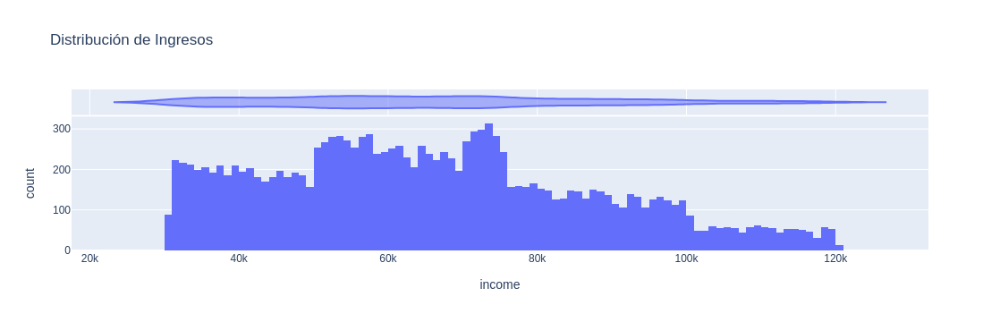

In [32]:
fig.show()

### Distribución de Ingresos por Género

In [33]:
fig = px.box(
    table_client,
    y='income',
    x='gender',
    title='Distribución de Ingresos por Género'
)

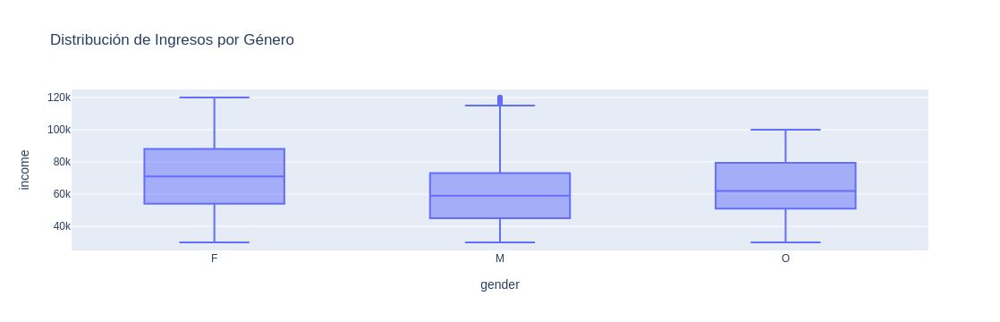

In [34]:
Teslafig.show()

* El ingreso de las mujeres está por encima del ingreso de hombres en la muestra de análisis y se refuerza con la distribución que se presenta en las tablas posteriores.

In [35]:
p = np.arange(0, 1.2, step=0.2)

In [36]:
table_client['income'].describe(percentiles=p).to_frame().T

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
income,14825.0,65404.991568,21598.29941,30000.0,30000.0,45000.0,57000.0,64000.0,70000.0,85000.0,120000.0,120000.0


In [37]:
(
    table_client
    .assign(
        gender=table_client['gender'].fillna('Unknown')
    )
    .groupby('gender')['income']
    .describe(percentiles=p)
)

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
gender,,,,,,,,,,,,
F,6129.0,71306.412139,22338.353773,30000.0,30000.0,51000.0,64000.0,71000.0,76000.0,92000.0,120000.0,120000.0
M,8484.0,61194.601603,20069.517615,30000.0,30000.0,42000.0,54000.0,59000.0,65000.0,77000.0,120000.0,120000.0
O,212.0,63287.735849,18938.594726,30000.0,30000.0,46000.0,57000.0,62000.0,68000.0,83000.0,100000.0,100000.0
Unknown,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
(
    table_client
    .assign(
        gender=table_client['gender'].fillna('Unknown')
    )
    .groupby('gender')['income']
    .describe(percentiles=np.arange(0.0,1.01,0.01))
).loc[:, ['0%', '1%', '2%', '3%', '4%', '5%', '95%', '96%', '97%', '98%', '99%', '100%']]

,0%,1%,2%,3%,4%,5%,95%,96%,97%,98%,99%,100%
gender,,,,,,,,,,,,
F,30000.0,31000.0,32000.0,33000.0,34000.0,35000.0,110000.0,112000.0,114000.0,116000.0,118000.0,120000.0
M,30000.0,31000.0,31000.0,32000.0,32000.0,33000.0,98000.0,100000.0,105000.0,110000.0,114000.0,120000.0
O,30000.0,30110.0,31000.0,31330.0,32000.0,32550.0,94000.0,95000.0,97000.0,97780.0,98890.0,100000.0
Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Distribución de Clientes por Género

In [39]:
fig = px.pie(
    table_client,
    names='gender',
    title='Distribución de Clientes por Género'
)

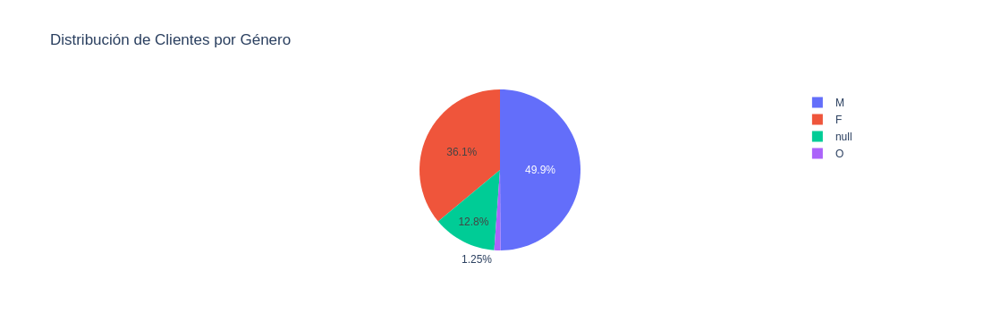

In [40]:
fig.show()

* Hay más concentración de hombres que de mujeres, un 50% vs 36%.

### Ingreso por Edad

In [41]:
fig = px.scatter(
    table_client,
    x='age',
    y='income'
)

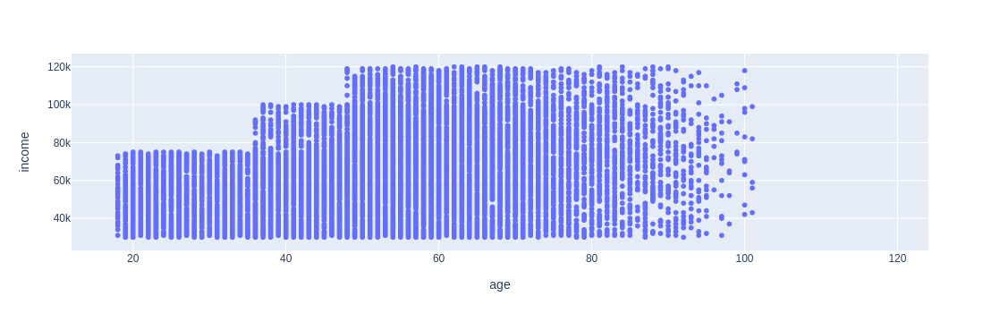

In [42]:
fig.show()

### Distribución de Edad

In [43]:
fig = px.histogram(
    table_client,
    x='age',
    marginal='violin',
    title='Distribución de Edad'
)

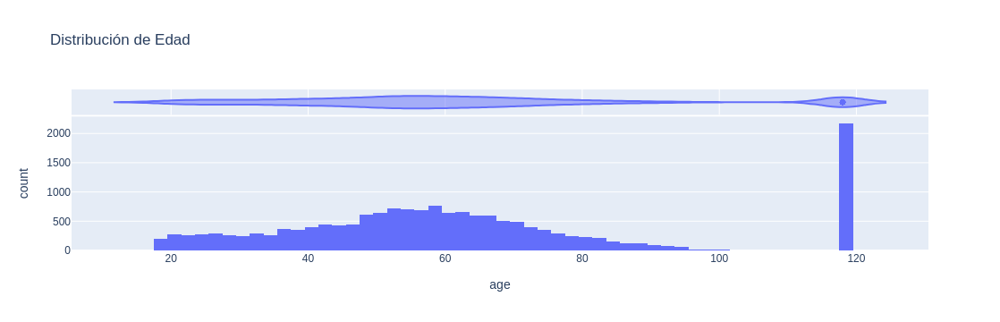

In [44]:
fig.show()

### Distribución de Edad por Género

In [45]:
fig = px.box(
    table_client,
    y='age',
    x='gender',
    title='Distribución de Edad por Género'
)

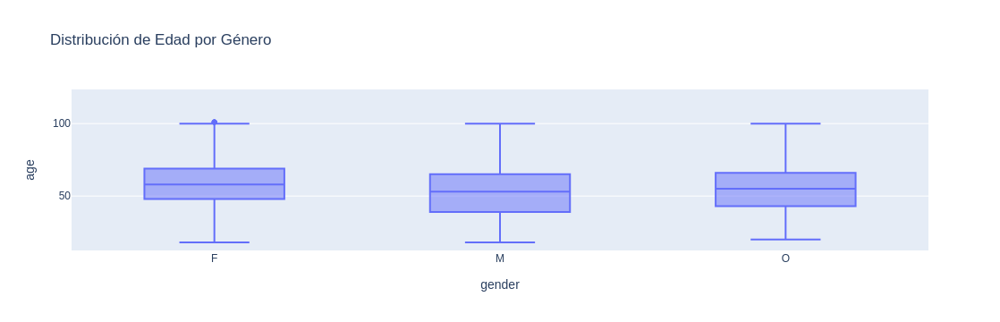

In [46]:
fig.show()

In [47]:
table_client['age'].describe(percentiles=p).to_frame().T

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
age,17000.0,62.531412,26.73858,18.0,18.0,41.0,54.0,58.0,63.0,78.0,118.0,118.0


In [48]:
(
    table_client
    .assign(
        gender=table_client['gender'].fillna('Unknown')
    )
    .groupby('gender')['age']
    .describe(percentiles=p)
)

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
gender,,,,,,,,,,,,
F,6129.0,57.544950,16.883315,18.0,18.0,44.0,54.0,58.0,62.0,72.0,101.0,101.0
M,8484.0,52.116690,17.413894,18.0,18.0,36.0,49.0,53.0,58.0,67.0,100.0,100.0
O,212.0,54.400943,16.244710,20.0,20.0,40.0,51.0,55.0,58.0,68.0,100.0,100.0
Unknown,2175.0,118.000000,0.000000,118.0,118.0,118.0,118.0,118.0,118.0,118.0,118.0,118.0


In [49]:
(
    table_client
    .assign(
        gender=table_client['gender'].fillna('Unknown')
    )
    .groupby('gender')['age']
    .describe(percentiles=np.arange(0.0,1.01,0.01))
).loc[:, ['0%', '1%', '2%', '3%', '4%', '5%', '95%', '96%', '97%', '98%', '99%', '100%']]

,0%,1%,2%,3%,4%,5%,95%,96%,97%,98%,99%,100%
gender,,,,,,,,,,,,
F,18.0,20.0,22.0,23.00,25.00,26.0,86.0,87.0,89.0,91.00,94.00,101.0
M,18.0,19.0,20.0,20.00,21.00,22.0,80.0,82.0,84.0,86.00,90.00,100.0
O,20.0,20.0,21.0,21.33,24.44,26.0,81.0,82.0,84.0,88.12,89.89,100.0
Unknown,118.0,118.0,118.0,118.00,118.00,118.0,118.0,118.0,118.0,118.00,118.00,118.0


* La mayoría de mujeres son más grandes de edad que los hombres.
* 1% de los clientes por género no desconocido tiene arriba de 90 años.
* Las registros nulos (Unknown) tienen el mismo valor de edad, indicando que el valor de edad 118 puede significar dato faltante.

### Distribución de Gasto

In [50]:
fig = px.histogram(
    table_client,
    x='amount_sum',
    marginal='violin',
    title='Distribución de Gasto'
)

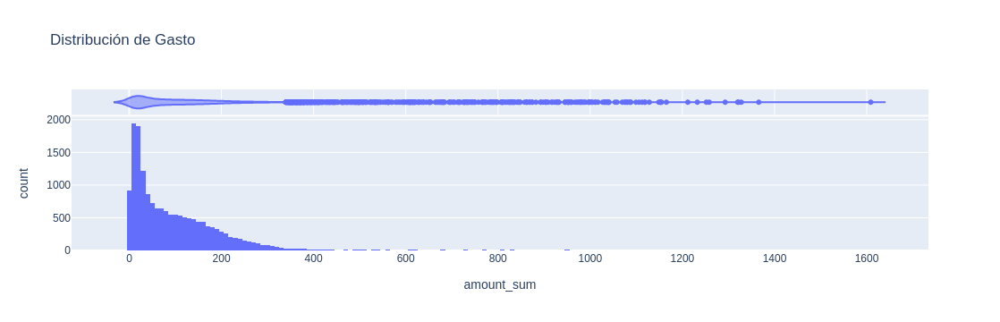

In [51]:
fig.show()

### Distribución de Gasto Promedio

In [52]:
fig = px.histogram(
    table_client,
    x='amount_mean',
    marginal='violin',
    title='Distribución de Gasto Promedio'
)

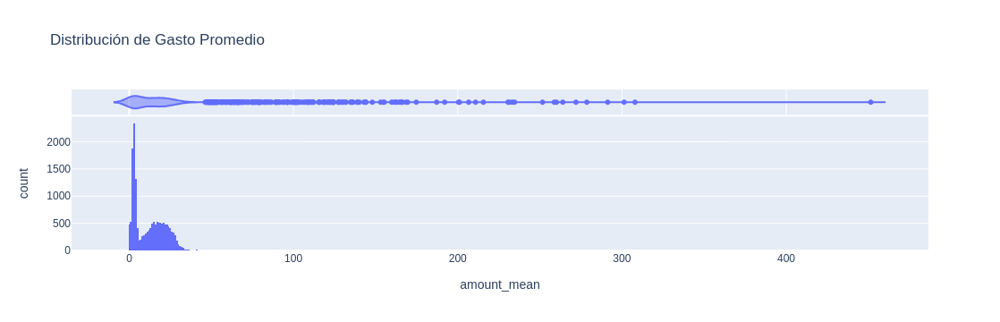

In [53]:
fig.show()

In [54]:
table_client['amount_mean'].describe(percentiles=np.arange(0,1.2,0.2)).to_frame().T

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
amount_mean,17000.0,13.340673,15.998435,0.0,0.0,2.705,4.988182,11.413523,15.205,21.945571,451.47,451.47


In [55]:
(
    table_client['amount_mean']
    .describe(percentiles=np.arange(0.0,1.01,0.01))
    .to_frame().T
).loc[:, ['0%', '1%', '2%', '3%', '4%', '5%', '95%', '96%', '97%', '98%', '99%', '100%']]

,0%,1%,2%,3%,4%,5%,95%,96%,97%,98%,99%,100%
amount_mean,0.0,0.0,0.0,0.674925,1.108267,1.355,28.517625,29.4502,31.030187,34.876933,68.157442,451.47


* El 50% gasta en promedio menos de $\$$11, solo 1% gasta arriba de $\$$70.

In [56]:
(
    table_client
    .assign(
        gender=table_client['gender'].fillna('Unknown')
    )
    .groupby('gender')['amount_mean']
    .describe(percentiles=p)
)

,count,mean,std,min,0%,20%,40%,50%,60%,80%,100%,max
gender,,,,,,,,,,,,
F,6129.0,18.489113,18.107733,0.0,0.0,8.321544,15.270000,17.790000,20.164571,24.910425,451.470000,451.470000
M,8484.0,12.332813,14.824079,0.0,0.0,2.840000,4.298333,9.111748,13.694667,20.525462,307.930000,307.930000
O,212.0,14.550895,12.562913,0.0,0.0,4.558364,12.505556,14.536190,16.658718,20.169667,142.958333,142.958333
Unknown,2175.0,2.646114,3.320187,0.0,0.0,1.408629,1.972051,2.216923,2.480000,3.259067,82.070000,82.070000


* Las mujeres gastan más en promedio que los hombres.

### Distribución del Tiempo entre el momento que el cliente visualiza la oferta y el momento que la recibe

In [57]:
fig = px.histogram(
    table_client,
    x='hrs_since_received_mean',
    marginal='violin',
    title='Distribución del Tiempo entre el momento que el cliente visualiza la oferta y el momento que la recibe'
)

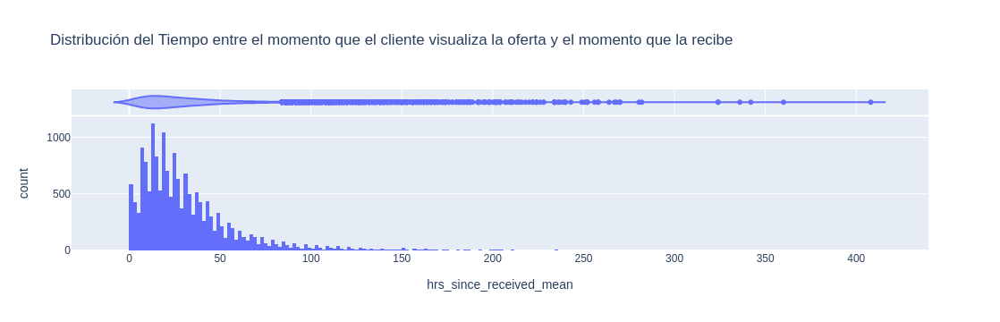

In [58]:
fig.show()

In [59]:
(
    table_client.query('time_received == 1')['hrs_since_received_mean']
    .apply(lambda x: x//24)
    .describe(percentiles=np.arange(0,1.05,0.05))
    .to_frame().T
)

,count,mean,std,min,0%,5%,10%,15%,20%,25%,30%,35%,40%,45%,50%,55%,60%,65%,70%,75%,80%,85%,90%,95%,100%,max
hrs_since_received_mean,16983.0,0.887417,1.297533,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,3.0,17.0,17.0


* El 50% de los clientes ve la oferta el mismo día que le es enviada.
* Un 30% la visualiza al siguiente día de recibirla.
* Un 10% la visualiza dos días después.
* El 10% restante la visualiza después de dos días de que se envió la oferta.

### Relación entre tasa de visualización y tasa de finalización

Con el objetivo de explorar si existe una relación directa entre la tasa de visualización de ofertas y la tasa de finalización, se realizó un análisis gráfico mediante un diagrama de dispersión.

Intuitivamente, sería esperable observar que los clientes que visualizan una mayor proporción de ofertas también presenten mayores niveles de finalización o aprovechamiento de promociones. Sin embargo, la distribución observada muestra una alta dispersión de puntos y ausencia de una tendencia lineal clara.

Este comportamiento sugiere que visualizar una oferta no necesariamente implica que el cliente complete o aproveche la promoción, por lo que probablemente intervienen otros factores asociados al comportamiento del usuario, preferencias comerciales o tipo de oferta recibida.

En consecuencia, ambas variables aportan información distinta dentro del análisis y pueden resultar complementarias para el proceso de segmentación de clientes.

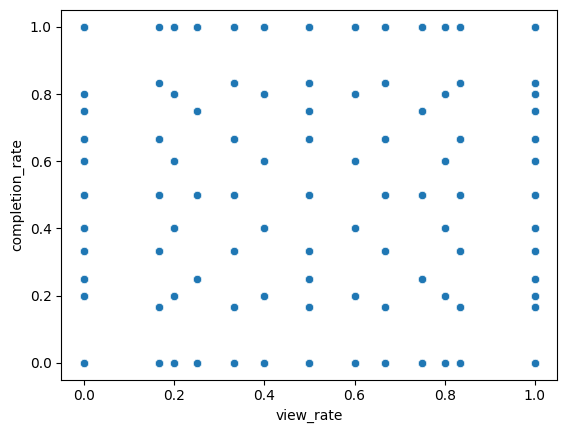

In [60]:
# versión seaborn

sns.scatterplot(data=table_offers_agg, x='view_rate', y='completion_rate')
plt.show()

In [61]:
# Versión plotly

fig = px.scatter(
    table_offers_agg,
    x='view_rate',
    y='completion_rate',
    opacity=0.7,
    trendline='ols',
    title='Relación entre tasa de visualización y tasa de finalización'
)

fig.update_layout(
    xaxis_title='Tasa de visualización',
    yaxis_title='Tasa de finalización'
)

fig.show()

In [62]:
# Versión plotly parecida a seaborn

fig = px.scatter(
    table_offers_agg,
    x='view_rate',
    y='completion_rate',
    opacity=1,
    width=500,
    height=500
)

fig.update_traces(
    marker=dict(size=6)
)

fig.show()

## Outliers

#### Prompt utilizado en IA

Aplicar detección de valores atípicos sobre el conjunto analítico final utilizando el algoritmo `IsolationForest`.  

El procedimiento debe:

- considerar únicamente variables numéricas,
- generar una bandera binaria indicando registros atípicos y no atípicos,
- utilizar una proporción de contaminación del `1.8%`,
- permitir separar el conjunto original entre observaciones normales y observaciones detectadas como anomalías.

Adicionalmente, integrar una justificación metodológica indicando que:

- el análisis exploratorio previo identificó aproximadamente un `1%` de observaciones concentradas en percentiles extremos de variables como edad y gasto promedio,
- el valor de contaminación fue definido considerando aproximadamente `0.9%` asociado a cada cola de la distribución,
- y que el análisis inicial de atípicos fue realizado de forma univariada, mientras que `IsolationForest` evalúa simultáneamente el comportamiento multivariado del conjunto de variables.


---

#### Detección de valores atípicos mediante Isolation Forest

Con el objetivo de identificar observaciones atípicas dentro del conjunto de datos, se utilizó el algoritmo `IsolationForest`, el cual permite detectar registros anómalos considerando simultáneamente el comportamiento conjunto de las variables incluidas en el análisis.

Previamente, se realizó una revisión univariada de variables relevantes como edad e ingreso/gasto promedio, observándose que aproximadamente el 1% de los registros se concentraba en percentiles extremos de ambas distribuciones. A partir de este análisis exploratorio, se decidió utilizar un nivel de contaminación de `1.8%` dentro del modelo, considerando aproximadamente `0.9%` asociado a cada cola de la distribución.

El método fue aplicado sobre las variables numéricas del conjunto analítico final, generando una bandera binaria para distinguir entre observaciones normales y posibles valores atípicos.

**Nota.** El análisis preliminar de valores atípicos se realizó de forma univariada, mientras que `IsolationForest` considera de manera conjunta el comportamiento multivariado del conjunto de variables, permitiendo identificar anomalías que no necesariamente son evidentes al analizar cada variable por separado.

In [63]:
model_df = table_client.copy()

num_cols = model_df.select_dtypes(include='number').columns.tolist()

iso = IsolationForest(
    contamination=0.018, # 2.5%
    random_state=16,
    n_estimators=200,
    n_jobs=-1
)

outliers = iso.fit_predict(model_df[num_cols])

model_df['outlier'] = (outliers == -1).astype(int)

print(model_df['outlier'].value_counts())

outliers_df = model_df[model_df['outlier'] == 1]

clean_df = model_df[model_df['outlier'] == 0]

print(
    'Original:', model_df.shape,
    '\nSin outliers:', clean_df.shape,
    '\nOutliers:', outliers_df.shape
)

outlier
0    16694
1      306
Name: count, dtype: int64
Original: (17000, 89) 
Sin outliers: (16694, 89) 
Outliers: (306, 89)


In [64]:
display(
    outliers_df.head(10)
)

,gender,age,person_id,became_member_on,income,offers_received,offers_received_distinct,offers_viewed_sum,view_rate,offers_completed_sum,completion_rate,time_received_min,time_received_max,time_received_mean,time_received_median,time_reviewed_min,time_reviewed_max,time_reviewed_mean,time_reviewed_median,time_completed_min,time_completed_max,time_completed_mean,time_completed_median,hrs_since_received_min,hrs_since_received_max,...,discount_mean,discount_max,informational_sum,informational_mean,informational_max,bogo_sum,bogo_mean,bogo_max,completion_from_view_rate,amount_sum,amount_mean,amount_min,amount_max,amount_median,trxs,con_oferta_sin_trxs,con_oferta_y_trxs,sin_oferta_con_trxs,year,month,week,time_received,time_reviewed,time_completed,outlier
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.0,2.0,2.0,0.0,0.000000,1.0,0.500000,408.0,504.0,456.0,456.0,0.0,0.0,0.0,0.0,528.0,528.0,528.0,528.0,0.0,0.0,...,0.000000,0.0,1.0,0.5,1.0,1.0,0.500000,1.0,inf,77.01,25.670000,21.51,32.28,23.220,3.0,0,1,0,2017,7,3,1,0,1,1
14,M,26,e12aeaf2d47d42479ea1c4ac3d8286c6,2014-02-13,46000.0,6.0,3.0,1.0,0.166667,2.0,0.333333,0.0,576.0,332.0,372.0,414.0,414.0,414.0,414.0,456.0,456.0,456.0,456.0,6.0,6.0,...,0.833333,1.0,0.0,0.0,0.0,1.0,0.166667,1.0,2.0,56.22,5.110909,0.22,11.58,5.970,11.0,0,1,0,2014,2,2,1,1,1,1
44,None,118,5b8f1f0e0930464f93bb55e59b5a04e0,2014-11-11,NaN,2.0,1.0,2.0,1.000000,0.0,0.000000,336.0,408.0,372.0,372.0,354.0,456.0,405.0,405.0,0.0,0.0,0.0,0.0,18.0,48.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,7.31,1.462000,0.06,2.98,1.150,5.0,0,1,0,2014,11,2,1,1,0,1
52,F,56,e9844d5beac04bf8b8d3ad18f7e37fca,2017-06-26,52000.0,3.0,2.0,1.0,0.333333,2.0,0.666667,336.0,504.0,416.0,408.0,594.0,594.0,594.0,594.0,528.0,528.0,528.0,528.0,90.0,90.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.0,87.11,12.444286,6.88,17.39,14.180,7.0,0,1,0,2017,6,4,1,1,1,1
118,F,59,15953663abf54181adf1fd4c39442b85,2017-09-10,98000.0,3.0,1.0,1.0,0.333333,3.0,1.000000,0.0,576.0,304.0,336.0,102.0,102.0,102.0,102.0,120.0,642.0,370.0,348.0,102.0,102.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,3.0,112.04,28.010000,15.08,39.99,28.485,4.0,0,1,0,2017,9,2,1,1,1,1
150,M,33,3f36bc1d5fc0499b9f96f62348f0f9b0,2015-04-21,43000.0,4.0,3.0,1.0,0.250000,1.0,0.250000,0.0,576.0,288.0,288.0,186.0,186.0,186.0,186.0,408.0,408.0,408.0,408.0,18.0,18.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,19.78,2.472500,0.49,6.54,1.770,8.0,0,1,0,2015,4,3,1,1,1,1
204,M,38,1eed89c11cc749a4bb93d8cef032821d,2017-07-09,74000.0,1.0,1.0,1.0,1.000000,1.0,1.000000,576.0,576.0,576.0,576.0,576.0,576.0,576.0,576.0,588.0,588.0,588.0,588.0,0.0,0.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,796.77,99.596250,12.32,644.11,20.795,8.0,0,1,0,2017,7,2,1,1,1,1
239,M,25,97b2476046874de3975e8feee95a1f98,2016-04-06,73000.0,1.0,1.0,1.0,1.000000,1.0,1.000000,576.0,576.0,576.0,576.0,600.0,600.0,600.0,600.0,654.0,654.0,654.0,654.0,24.0,24.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,69.87,6.987000,2.32,18.64,5.600,10.0,0,1,0,2016,4,1,1,1,1,1
465,F,41,b3e4bca407e849568ceec8454336bc24,2015-10-15,41000.0,2.0,2.0,1.0,0.500000,0.0,0.000000,0.0,504.0,252.0,252.0,336.0,336.0,336.0,336.0,0.0,0.0,0.0,0.0,336.0,336.0,...,0.500000,1.0,1.0,0.5,1.0,0.0,0.000000,0.0,0.0,27.03,3.378750,0.92,7.72,2.275,8.0,0,1,0,2015,10,3,1,1,0,1
568,F,24,461e13a14a074077b3ebd7ad0174e02b,2018-04-16,51000.0,2.0,2.0,1.0,0.500000,2.0,1.000000,0.0,168.0,84.0,84.0,0.0,0.0,0.0,0.0,36.0,366.0,201.0,201.0,0.0,0.0,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.0,142.22,14.222000,7.03,19.95,13.935,10.0,0,1,0,2018,4,3,1,0,1,1


## Imputación

Después de revisar las distribuciones de estas dos variables y con el fin de evitar imputaciones de forma univarada como moda, media o mediana haré uso del imputador MICE.

#### Imputación del Ingreso

In [65]:
imputer = IterativeImputer(
    random_state=16,
    max_iter=10
)

In [66]:
model_df = clean_df.copy()

In [67]:
model_df.select_dtypes('object').columns

Index(['gender', 'person_id'], dtype='object')

In [68]:
model_df.drop(columns=['person_id'], inplace=True)

In [69]:
model_df['gender_ohe'] = model_df['gender'].map({'M': 0, 'F': 1, 'O': 2}) # codificación del género porque MICE no acepta strings

In [70]:
model_df.drop(columns=['gender'], inplace=True)

In [71]:
model_df.drop(columns=['became_member_on'], inplace=True)

In [72]:
model_df.replace(
    [np.inf, -np.inf],
    0,
    inplace=True
) # reemplazo de valores infinitos o indefinidos por cero

In [73]:
np.isinf(
    model_df.select_dtypes(include='number')
).sum().sum() # validación de la falta de existencia de valores infinitos o indefinidos

0

Con el fin de evitar uso innecesario de máquina trabajaré con variables que considero relevantes para la imputación del género e ingreso.

In [74]:
features = table_client.filter(like='sum').columns.tolist() \
    + ['time_received', 'time_reviewed', 'time_completed'] \
    + ['age', 'income', 'trxs', 'view_rate', 'completion_rate']

In [75]:
mice_df = table_client[features].copy()

In [76]:
mice_imputed = pd.DataFrame(
    imputer.fit_transform(mice_df),
    columns=mice_df.columns,
    index=mice_df.index
)

In [77]:
model_df['income'] = mice_imputed['income']

In [78]:
nulls = model_df.isna().mean(axis=0)

In [79]:
nulls[nulls > 0].sort_values(ascending=False).head()

gender_ohe    0.12813
dtype: float64

#### Imputación del Género

In [80]:
from sklearn.ensemble import RandomForestClassifier

In [81]:
gender_df = model_df.copy()

train_mask = gender_df['gender_ohe'].notna()

X_train = gender_df.loc[train_mask, features]
y_train = gender_df.loc[train_mask, 'gender_ohe']

pred_mask = gender_df['gender_ohe'].isna()

X_pred = gender_df.loc[pred_mask, features]

rf_gender = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=5,
    random_state=42,
    n_jobs=-1
)

rf_gender.fit(X_train, y_train)

gender_pred = rf_gender.predict(X_pred)

model_df.loc[pred_mask, 'gender_ohe'] = gender_pred

print(
    'Nulos restantes:',
    model_df['gender_ohe'].isna().sum()
)

model_df['gender_ohe'].value_counts(dropna=False)

Nulos restantes: 0


gender_ohe
0.0    10002
1.0     6482
2.0      210
Name: count, dtype: int64

In [82]:
clean_df['gender'].value_counts(dropna=False)

gender
M       8336
F       6009
None    2139
O        210
Name: count, dtype: int64

In [83]:
(
    pd.concat(
        [
            pd.Series(model_df['gender_ohe'].value_counts(dropna=False), name='imputado'),
            pd.Series(clean_df['gender'].map({'M': 0, 'F': 1, 'O': 2}).value_counts(dropna=True), name='original')
        ],
        axis=1
    )
    .assign(
        diff=lambda x: x['imputado'] - x['original']
    )
)

,imputado,original,diff
0.0,10002,8336,1666
1.0,6482,6009,473
2.0,210,210,0


* El modelo asocia más los valores faltantes del género al comportamiento de los hombres que se encuentran en la muestra.

In [84]:
model_df.isna().sum().sum() # validación de que no haya nulos

0

# Escalamiento

In [85]:
sc = MinMaxScaler()

In [86]:
Xi = model_df.copy()

Xi = Xi.loc[:, Xi.nunique() > 1] # eliminar variables con 1 solo valor

Xs = pd.DataFrame(data=sc.fit_transform(Xi), columns=Xi.columns, index=Xi.index)

# Multicolinealidad

In [87]:
Path('resultados').mkdir(parents=True, exist_ok=True)

In [88]:
vc = VarClusHi(df=Xs, feat_list=Xs.columns, maxclus=10)

In [89]:
vc.varclus()

In [90]:
pd.to_pickle(vc.rsquare, "resultados/varclus_results.pickle")

In [91]:
vc.rsquare.sort_values(by=["Cluster", "RS_Ratio"])

,Cluster,Variable,RS_Own,RS_NC,RS_Ratio
11,0,hrs_since_rev_or_rec_mean,0.931895,0.263981,0.092532
3,0,hrs_com_since_received_mean,0.915470,0.339436,0.127966
12,0,hrs_since_rev_or_rec_median,0.869261,0.206375,0.164737
4,0,hrs_com_since_received_median,0.867533,0.287252,0.185855
7,0,hrs_com_since_reviewed_mean,0.836737,0.186158,0.200608
...,...,...,...,...,...
78,9,reward_mean,0.945925,0.333879,0.081179
80,9,bogo_mean,0.771909,0.138448,0.264745
79,9,reward_median,0.760947,0.219869,0.306427
82,9,reward_max,0.545465,0.159796,0.540982


In [92]:
res = vc.rsquare.sort_values(by=["Cluster", "RS_Ratio"]).groupby(["Cluster"]).first()

In [93]:
pd.to_pickle(res, "resultados/bf_clustering.diplo")

In [94]:
res = pd.read_pickle("resultados/bf_clustering.diplo")

In [95]:
res

,Variable,RS_Own,RS_NC,RS_Ratio
Cluster,,,,
0,hrs_since_rev_or_rec_mean,0.931895,0.263981,0.092532
1,informational_max,0.927395,0.161577,0.086597
2,time_completed_max,0.899472,0.304905,0.144625
3,duration_mean,0.813100,0.392412,0.307610
4,offers_received,0.824709,0.072283,0.188949
5,time_reviewed_mean,0.765717,0.041234,0.244359
6,amount_mean,0.844879,0.113531,0.174987
7,web_mean,0.686849,0.104328,0.349627
8,hrs_since_received_median,0.884716,0.023339,0.118039


In [96]:
bf = [x for x in res["Variable"]]

In [97]:
Xv = Xs[bf]

In [98]:
Xv.head(10)

,hrs_since_rev_or_rec_mean,informational_max,time_completed_max,duration_mean,offers_received,time_reviewed_mean,amount_mean,web_mean,hrs_since_received_median,reward_mean
0,0.170213,0.0,0.773109,0.822222,0.8,0.586325,0.005021,1.000000,0.014706,0.280000
2,0.000000,1.0,0.000000,0.259259,0.2,0.594017,0.005279,0.500000,0.110294,0.250000
3,0.202128,1.0,0.714286,0.333333,0.6,0.431624,0.050397,0.500000,0.066176,0.500000
4,0.000000,1.0,0.000000,0.614815,0.8,0.566239,0.003433,0.800000,0.066176,0.300000
5,0.090426,1.0,0.731092,0.555556,0.6,0.455840,0.042624,1.000000,0.044118,0.225000
6,0.000000,1.0,0.000000,0.585185,0.8,0.449573,0.000000,1.000000,0.073529,0.320000
7,0.000000,0.0,0.000000,0.496296,0.8,0.538462,0.000266,0.800000,0.132353,0.600000
8,0.200355,0.0,0.840336,0.530864,1.0,0.492877,0.026897,1.000000,0.036765,0.400000
9,0.095745,1.0,0.647059,0.259259,0.6,0.518519,0.005766,0.750000,0.044118,0.500000
10,0.000000,0.0,0.957983,0.555556,0.4,0.501425,0.016344,0.666667,0.058824,0.533333


# Reducción de Dimensionalidad

## PCA

In [99]:
SEED = 42

np.random.seed = SEED
random.seed = SEED

In [100]:
pca = PCA(n_components=0.9)

In [101]:
Xp = pd.DataFrame(data=pca.fit_transform(Xv), index=Xv.index)

In [102]:
pca.explained_variance_ratio_.cumsum()

array([0.48063472, 0.73693432, 0.81566466, 0.88863185, 0.92315719])

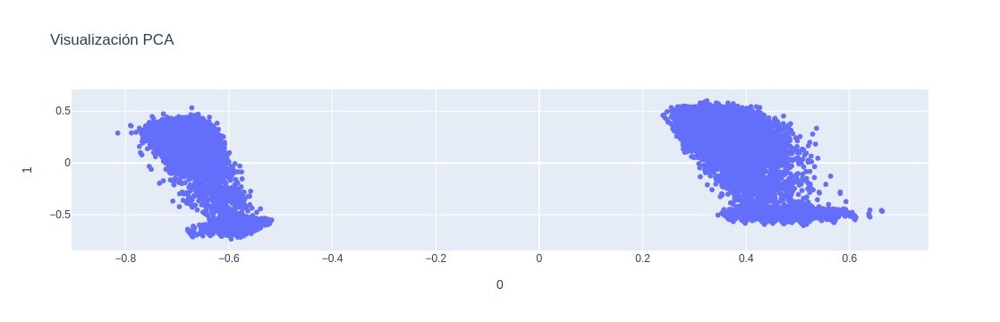

In [103]:
plot_df = (
    Xp
    .reset_index(drop=True)
)

fig = px.scatter(
    plot_df,
    x=0,
    y=1,
    title='Visualización PCA'
)

fig.show()

## TSNE

### Intro

Con el objetivo de visualizar la estructura interna de los datos y explorar posibles agrupamientos naturales entre clientes, se aplicó el algoritmo *t-Distributed Stochastic Neighbor Embedding* (t-SNE).

t-SNE es una técnica de reducción de dimensionalidad no lineal orientada principalmente a visualización, la cual preserva relaciones locales entre observaciones, permitiendo representar datos de alta dimensionalidad en un espacio bidimensional.

A diferencia de métodos lineales como PCA, t-SNE busca conservar vecindades y similitudes locales entre registros, facilitando la identificación visual de patrones, regiones densas y posibles segmentos de comportamiento.

Para reducir ruido y complejidad computacional, la técnica fue aplicada sobre las componentes principales obtenidas previamente mediante PCA.

### Configuración utilizada

- Número de componentes: 2
- Inicialización: PCA
- Perplexity: 30
- Número máximo de iteraciones: 1000
- Semilla aleatoria: 42

### Nota

t-SNE preserva relaciones locales entre observaciones, pero no mantiene necesariamente las distancias globales originales, por lo que la separación visual entre grupos debe interpretarse como una aproximación exploratoria y no como una distancia exacta entre segmentos.

---

### Prompt utilizado para apoyo de IA

> Analiza la visualización generada mediante t-SNE considerando que proviene de un problema de segmentación de clientes. Describe de forma académica y profesional los patrones observados, indicando si existen agrupamientos parciales, regiones densas, continuidad entre grupos o posibles perfiles de comportamiento diferenciados. Explica también las limitaciones interpretativas de t-SNE respecto a las distancias globales y aclara que la técnica fue utilizada únicamente como herramienta exploratoria previa al clustering.

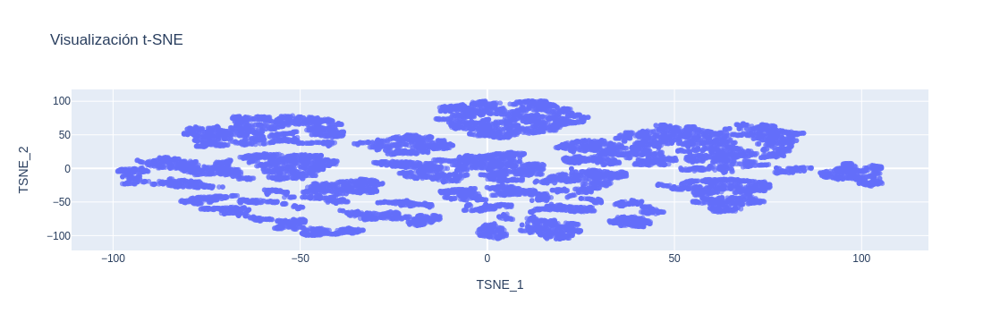

In [104]:
tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate='auto',
    init='pca',
    max_iter=1000,
    random_state=42
)

X_tsne = tsne.fit_transform(Xp)


tsne_df = pd.DataFrame(
    X_tsne,
    columns=['TSNE_1', 'TSNE_2'],
    index=Xp.index
)

fig = px.scatter(
    tsne_df,
    x='TSNE_1',
    y='TSNE_2',
    opacity=0.7,
    title='Visualización t-SNE'
)

fig.show()

La proyección mediante t-SNE evidencia la existencia de agrupamientos locales y patrones de comportamiento diferenciados entre clientes. Si bien no se observan fronteras completamente separadas, sí existen regiones densas y estructuras parcialmente aisladas que sugieren la presencia de segmentos con características similares.

# Clustering

## Número óptimo de clusters

In [105]:
df_cl = pd.DataFrame()
for k in range(2, 10):
    print(k)
    #mini_Xp = Xp.sample(frac=0.1)
    kmeans = KMeans(n_clusters=k, random_state=10).fit(Xp)
    if k == 3:
        labels = kmeans.labels_
    clusters = kmeans.labels_
    df_cl.loc[k, "inertia"] = kmeans.inertia_
    df_cl.loc[k, "db"] = davies_bouldin_score(Xp, clusters)
    df_cl.loc[k, "sil"] = silhouette_score(Xp, clusters)

2
3
4
5
6
7
8
9


In [106]:
df_cl

,inertia,db,sil
2,3974.142393,0.888467,0.492344
3,2692.046923,0.822261,0.465489
4,1961.613490,0.874313,0.474895
5,1826.100481,1.126063,0.409664
6,1769.717029,1.327586,0.387348
7,1597.020420,1.480200,0.277800
8,1505.352326,1.361116,0.284389
9,1385.405722,1.448003,0.245713


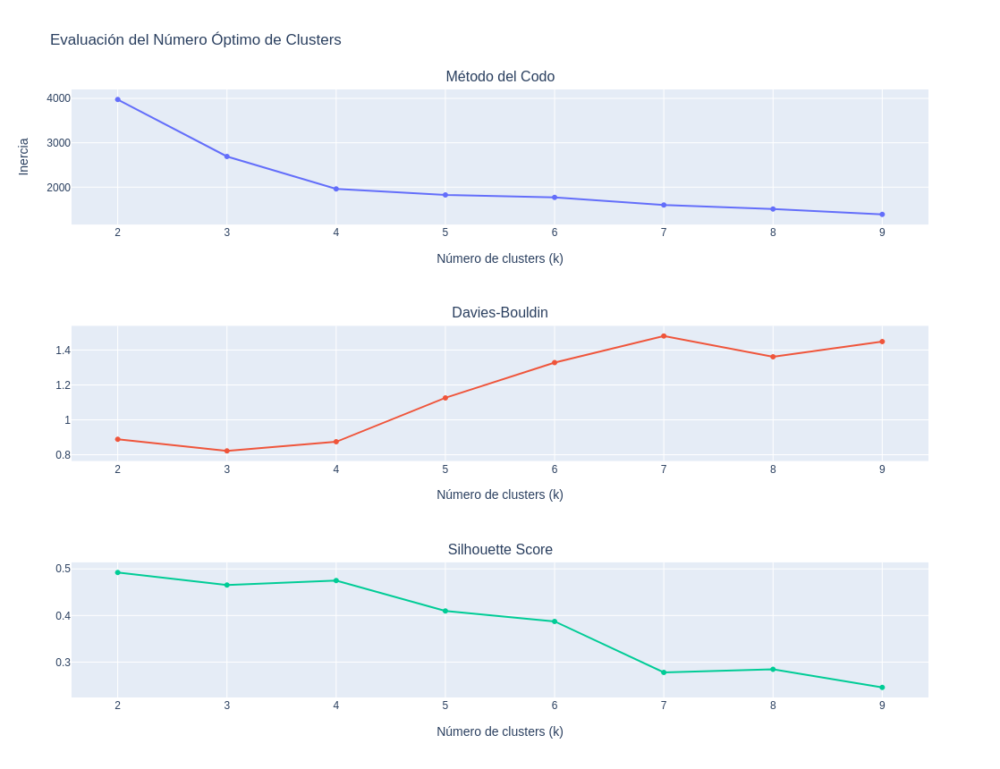

In [107]:
fig = make_subplots(
    rows=3,
    cols=1,
    subplot_titles=[
        'Método del Codo',
        'Davies-Bouldin',
        'Silhouette Score'
    ]
)


fig.add_trace(
    go.Scatter(
        x=df_cl.index,
        y=df_cl['inertia'],
        mode='lines+markers',
        name='Inertia'
    ),
    row=1,
    col=1
)


fig.add_trace(
    go.Scatter(
        x=df_cl.index,
        y=df_cl['db'],
        mode='lines+markers',
        name='Davies-Bouldin'
    ),
    row=2,
    col=1
)

fig.add_trace(
    go.Scatter(
        x=df_cl.index,
        y=df_cl['sil'],
        mode='lines+markers',
        name='Silhouette'
    ),
    row=3,
    col=1
)


# =========================================
# Layout
# =========================================

fig.update_layout(
    title='Evaluación del Número Óptimo de Clusters',
    height=860,
    width=1080,
    showlegend=False
)

fig.update_xaxes(title='Número de clusters (k)')
fig.update_yaxes(title='Inercia', row=1, col=1)
fig.update_yaxes(title='DB Index', row=1, col=2)
fig.update_yaxes(title='Silhouette', row=1, col=3)

fig.show()

A partir de las métricas de evaluación obtenidas mediante el método del codo, índice Davies-Bouldin y coeficiente de Silhouette, se seleccionó un valor de k=4 para el algoritmo KMeans.

Si bien valores menores como k=2 presentaron un coeficiente de Silhouette ligeramente superior, la segmentación resultante era demasiado general y limitaba la interpretación de perfiles diferenciados.

Por otro lado, k=4 mantiene una buena cohesión y separación entre grupos, al mismo tiempo que permite identificar segmentos más específicos y consistentes con la estructura observada previamente en la visualización mediante t-SNE.

Valores superiores a k=5 mostraron una reducción marginal en la inercia y un deterioro progresivo en las métricas de calidad de clustering, sugiriendo una posible sobresegmentación de los clientes.

| Métrica | Objetivo | Interpretación |
|---|---|---|
| Inertia (Método del Codo) | Más bajo | Mide qué tan cercanos se encuentran los registros respecto al centroide de su cluster. Valores menores indican clusters más compactos. |
| Davies-Bouldin Index | Más bajo | Evalúa similitud entre clusters considerando dispersión y separación. Valores bajos indican mejor separación entre grupos. |
| Silhouette Score | Más alto | Mide cohesión y separación simultáneamente. Valores cercanos a 1 indican clusters bien definidos y separados. |

## KMeans

In [108]:
km = KMeans(n_clusters=4, random_state=SEED)

In [109]:
km.fit(Xp[[x for x in Xp.columns if not str(x).startswith("cl")]])

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [110]:
X = model_df.copy()

In [111]:
Xv["cl"] = X["cl"] = Xp["cl"] = [str(x) for x in km.predict(Xp[[x for x in Xp.columns if not str(x).startswith("cl")]])]

In [112]:
Xp['cl'].value_counts(normalize=True)

cl
2    0.403319
0    0.263328
1    0.220978
3    0.112376
Name: proportion, dtype: float64

### Visualización 2D TSNE por KMeans clusters

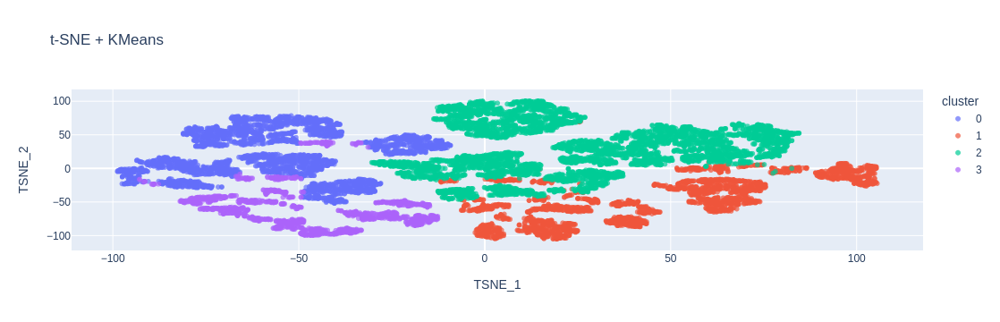

In [113]:
tsne_df['cluster'] = Xp['cl'].astype(str).values

fig = px.scatter(
    tsne_df,
    x='TSNE_1',
    y='TSNE_2',
    color='cluster',
    opacity=0.7,
    title='t-SNE + KMeans'
)

fig.show()

### Visualizacion 3D por KMeans clusters

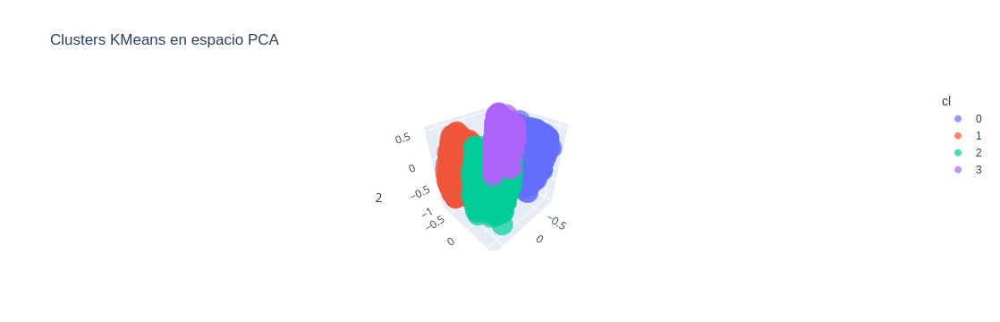

In [114]:
fig = px.scatter_3d(
    Xp,
    x=0,
    y=1,
    z=2,
    color='cl',
    opacity=0.7,
    title='Clusters KMeans en espacio PCA'
)

fig.show()

La visualización de los clusters sobre los espacios reducidos mediante t-SNE y PCA permite observar una separación relativamente clara entre segmentos de clientes.

En particular, el espacio t-SNE evidencia regiones diferenciadas con baja superposición entre grupos, sugiriendo que el algoritmo KMeans logró identificar patrones de comportamiento consistentes dentro de la muestra analizada.

Si bien existen zonas de transición entre algunos clusters, el resultado es coherente con problemas reales de segmentación de clientes, donde los perfiles suelen presentar relaciones graduales más que fronteras completamente discretas.

La representación tridimensional mediante PCA confirma adicionalmente la existencia de estructuras diferenciadas entre segmentos, aunque con una separación menos pronunciada debido a la naturaleza lineal del método.

## Gaussian Mixture Models

In [115]:
gmm = GaussianMixture(n_components=4)

In [116]:
gmm.fit(Xp[[x for x in Xp.columns if not str(x).startswith("cl")]])

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'kmeans'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,None


In [117]:
Xv["cl_gmm"] = X["cl_gmm"] = Xp["cl_gmm"] = [str(x) for x in gmm.predict(Xp[[x for x in Xp.columns if not str(x).startswith("cl")]])]

In [118]:
Xp['cl_gmm'].value_counts(normalize=True)

cl_gmm
1    0.446268
3    0.286390
2    0.178028
0    0.089314
Name: proportion, dtype: float64

### Visualización 2D TSNE por GMM clusters

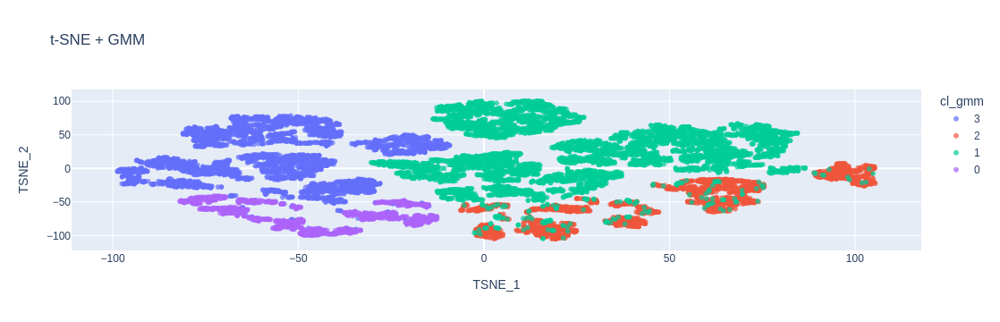

In [119]:
tsne_df['cl_gmm'] = Xp['cl_gmm'].astype(str).values

fig = px.scatter(
    tsne_df,
    x='TSNE_1',
    y='TSNE_2',
    color='cl_gmm',
    opacity=0.7,
    title='t-SNE + GMM'
)

fig.show()

### Visualizacion 3D TSNE por GMM clusters

In [120]:
fig = px.scatter_3d(
    Xp,
    x=0,
    y=1,
    z=2,
    color='cl_gmm',
    opacity=0.7,
    title='Clusters GMM en espacio PCA'
)

fig.show()

Al comparar los resultados obtenidos mediante KMeans y Gaussian Mixture Models (GMM), se observa que KMeans genera una separación visual más clara y compacta entre segmentos de clientes.

Por otro lado, GMM presenta un mayor grado de solapamiento entre clusters, particularmente en regiones intermedias del espacio reducido, lo cual es consistente con la naturaleza probabilística del algoritmo, que permite fronteras más suaves entre grupos.

Si bien ambos métodos logran identificar estructuras diferenciadas dentro de los datos, KMeans mostró una segmentación más interpretable visualmente y con menor mezcla entre segmentos, razón por la cual resulta una alternativa más adecuada para este análisis exploratorio de clientes.

In [121]:
Path('models').mkdir(parents=True, exist_ok=True)

In [122]:
#pd.to_pickle(im, "./models/imputer.pickle")
pd.to_pickle(sc, "./models/scaler.pickle")
pd.to_pickle(bf, "./models/best_features.pickle")
pd.to_pickle(pca, "./models/pca.pickle")
pd.to_pickle(gmm, "./models/gmm.pickle")

In [123]:
model_df.head()

,age,income,offers_received,offers_received_distinct,offers_viewed_sum,view_rate,offers_completed_sum,completion_rate,time_received_min,time_received_max,time_received_mean,time_received_median,time_reviewed_min,time_reviewed_max,time_reviewed_mean,time_reviewed_median,time_completed_min,time_completed_max,time_completed_mean,time_completed_median,hrs_since_received_min,hrs_since_received_max,hrs_since_received_mean,hrs_since_received_median,hrs_com_since_received_min,...,discount_max,informational_sum,informational_mean,informational_max,bogo_sum,bogo_mean,bogo_max,completion_from_view_rate,amount_sum,amount_mean,amount_min,amount_max,amount_median,trxs,con_oferta_sin_trxs,con_oferta_y_trxs,sin_oferta_con_trxs,year,month,week,time_received,time_reviewed,time_completed,outlier,gender_ohe
0,118,71449.623322,5.0,4.0,5.0,1.00,2.0,0.4,168.0,576.0,398.4,408.0,216.0,582.0,411.6,408.0,552.0,552.0,552.0,552.0,0.0,48.0,13.2,6.0,48.0,...,1.0,0.0,0.00,0.0,0.0,0.00,0.0,0.400000,20.40,2.266667,0.06,5.21,1.89,9.0,0,1,0,2017,2,2,1,1,1,0,0.0
2,118,69903.108603,2.0,2.0,2.0,1.00,0.0,0.0,168.0,576.0,372.0,372.0,168.0,666.0,417.0,417.0,0.0,0.0,0.0,0.0,0.0,90.0,45.0,45.0,0.0,...,0.0,1.0,0.50,1.0,1.0,0.50,1.0,0.000000,14.30,2.383333,1.34,4.09,1.89,6.0,0,1,0,2018,7,2,1,1,0,0,0.0
3,75,100000.000000,4.0,4.0,4.0,1.00,2.0,0.5,0.0,504.0,270.0,288.0,6.0,582.0,303.0,312.0,132.0,510.0,321.0,321.0,0.0,78.0,33.0,27.0,102.0,...,0.0,1.0,0.25,1.0,3.0,0.75,1.0,0.500000,159.27,22.752857,17.78,29.72,21.72,7.0,0,1,0,2017,5,2,1,1,1,0,1.0
4,118,71710.000329,5.0,3.0,4.0,0.80,0.0,0.0,0.0,576.0,364.8,408.0,6.0,624.0,397.5,480.0,0.0,0.0,0.0,0.0,0.0,120.0,43.5,27.0,0.0,...,1.0,2.0,0.40,1.0,0.0,0.00,0.0,0.000000,4.65,1.550000,0.06,3.50,1.09,3.0,0,1,0,2017,8,1,1,1,0,0,0.0
5,68,70000.000000,4.0,4.0,3.0,0.75,2.0,0.5,0.0,504.0,312.0,372.0,18.0,522.0,320.0,420.0,522.0,522.0,522.0,522.0,12.0,18.0,16.0,18.0,18.0,...,1.0,1.0,0.25,1.0,1.0,0.25,1.0,0.666667,57.73,19.243333,17.88,21.43,18.42,3.0,0,1,0,2018,4,4,1,1,1,0,0.0


In [124]:
perfil_clusters = (
    model_df
    .assign(cluster=Xp['cl'].astype(int).values)
    .groupby('cluster')
    .agg(
        clientes=('cluster', 'size'),

        # Demográficos
        edad_promedio=('age', 'mean'),
        ingreso_promedio=('income', 'mean'),

        pct_hombres=('gender_ohe', lambda x: (x == 0).mean()),
        pct_mujeres=('gender_ohe', lambda x: (x == 1).mean()),
        pct_otro=('gender_ohe', lambda x: (x == 2).mean()),

        # Consumo
        gasto_total_promedio=('amount_sum', 'mean'),
        ticket_promedio=('amount_mean', 'mean'),
        transacciones_promedio=('trxs', 'mean'),

        # Ofertas
        ofertas_recibidas=('offers_received', 'mean'),
        tasa_visualizacion=('view_rate', 'mean'),
        tasa_finalizacion=('completion_rate', 'mean'),
        tasa_finalizacion_vistas=('completion_from_view_rate', 'mean'),

        # Tiempos
        tiempo_promedio_ver=('hrs_since_received_mean', 'mean'),
        tiempo_promedio_completar=('hrs_since_rev_or_rec_mean', 'mean'),

        # Canales
        email=('email_mean', 'mean'),
        mobile=('mobile_mean', 'mean'),
        social=('social_mean', 'mean'),
        web=('web_mean', 'mean'),

        # Tipo de oferta
        bogo=('bogo_mean', 'mean'),
        discount=('discount_mean', 'mean'),
        informational=('informational_mean', 'mean')
    )
    .reset_index()
)

perfil_clusters['pct_clientes'] = (
    perfil_clusters['clientes']
    / perfil_clusters['clientes'].sum()
)

perfil_clusters.to_csv('./resultados/perfil_km.csv')

perfil_clusters

,cluster,clientes,edad_promedio,ingreso_promedio,pct_hombres,pct_mujeres,pct_otro,gasto_total_promedio,ticket_promedio,transacciones_promedio,ofertas_recibidas,tasa_visualizacion,tasa_finalizacion,tasa_finalizacion_vistas,tiempo_promedio_ver,tiempo_promedio_completar,email,mobile,social,web,bogo,discount,informational,pct_clientes
0,0,4396,58.584395,68474.931228,0.536397,0.448362,0.015241,142.841051,16.799910,9.722247,4.343722,0.810745,0.690806,0.924795,29.927229,68.333007,1.0,0.885430,0.640723,0.871516,0.500557,0.499443,0.000000,0.263328
1,1,3689,69.304690,61266.195892,0.721876,0.268365,0.009759,40.246316,7.026106,5.875576,4.428029,0.734391,0.056122,0.082827,33.865628,11.616969,1.0,0.911394,0.573525,0.734250,0.337097,0.309583,0.353321,0.220978
2,2,6733,59.021239,68438.657393,0.526363,0.459676,0.013961,137.028081,16.801265,9.236447,4.802317,0.787457,0.502626,0.699092,30.906342,65.323585,1.0,0.915120,0.591019,0.767102,0.340945,0.359738,0.299317,0.403319
3,3,1876,71.015991,60151.714971,0.765991,0.227079,0.006930,26.767820,4.757062,5.642324,4.061834,0.754122,0.073072,0.101741,33.116738,12.727612,1.0,0.871819,0.612100,0.871331,0.523268,0.476732,0.000000,0.112376


In [125]:
perfil_clusters = (
    model_df
    .assign(cluster=Xp['cl_gmm'].astype(int).values)
    .groupby(by=['cluster'])
    .agg(
        clientes=('cluster', 'size'),

        # Demográficos
        edad_promedio=('age', 'mean'),
        ingreso_promedio=('income', 'mean'),

        pct_hombres=('gender_ohe', lambda x: (x == 0).mean()),
        pct_mujeres=('gender_ohe', lambda x: (x == 1).mean()),
        pct_otro=('gender_ohe', lambda x: (x == 2).mean()),

        # Consumo
        gasto_total_promedio=('amount_sum', 'mean'),
        ticket_promedio=('amount_mean', 'mean'),
        transacciones_promedio=('trxs', 'mean'),

        # Ofertas
        ofertas_recibidas=('offers_received', 'mean'),
        tasa_visualizacion=('view_rate', 'mean'),
        tasa_finalizacion=('completion_rate', 'mean'),
        tasa_finalizacion_vistas=('completion_from_view_rate', 'mean'),

        # Tiempos
        tiempo_promedio_ver=('hrs_since_received_mean', 'mean'),
        tiempo_promedio_completar=('hrs_since_rev_or_rec_mean', 'mean'),

        # Canales
        email=('email_mean', 'mean'),
        mobile=('mobile_mean', 'mean'),
        social=('social_mean', 'mean'),
        web=('web_mean', 'mean'),

        # Tipo de oferta
        bogo=('bogo_mean', 'mean'),
        discount=('discount_mean', 'mean'),
        informational=('informational_mean', 'mean')
    )
    .reset_index()
)

perfil_clusters['pct_clientes'] = (
    perfil_clusters['clientes']
    / perfil_clusters['clientes'].sum()
)

perfil_clusters.to_csv('./resultados/perfil_gmm.csv')

cols_style = [
    col for col in perfil_clusters.columns
    if col not in ['cluster', 'gender_ohe']
]

(
    perfil_clusters.style
    .background_gradient(
        cmap='PuBu',
        subset=cols_style
    )
    .format(precision=2)
)

,cluster,clientes,edad_promedio,ingreso_promedio,pct_hombres,pct_mujeres,pct_otro,gasto_total_promedio,ticket_promedio,transacciones_promedio,ofertas_recibidas,tasa_visualizacion,tasa_finalizacion,tasa_finalizacion_vistas,tiempo_promedio_ver,tiempo_promedio_completar,email,mobile,social,web,bogo,discount,informational,pct_clientes
0,0,1491,73.41,59954.67,0.80,0.19,0.00,15.55,3.52,4.71,4.12,0.75,0.00,0.00,32.66,0.01,1.00,0.87,0.61,0.87,0.52,0.48,0.00,0.09
1,1,7450,59.19,68163.34,0.53,0.45,0.01,133.60,16.62,9.18,4.76,0.78,0.48,0.67,31.18,64.78,1.00,0.92,0.59,0.76,0.34,0.36,0.30,0.45
2,2,2972,71.35,60225.97,0.75,0.24,0.01,25.49,5.12,5.21,4.44,0.73,0.00,0.00,33.90,0.02,1.00,0.91,0.57,0.73,0.34,0.30,0.35,0.18
3,3,4781,58.84,67866.14,0.54,0.44,0.02,136.99,16.22,9.68,4.30,0.81,0.66,0.89,30.33,67.82,1.00,0.89,0.64,0.87,0.50,0.50,0.00,0.29


In [128]:
import dataframe_image as dfi

In [127]:
styled_df = (
    perfil_clusters.style
    .background_gradient(
        cmap='PuBu',
        subset=cols_style
    )
    .format(precision=2)
)

dfi.export(
    styled_df,
    './resultados/perfil_clusters.png',
    table_conversion='matplotlib'
)

In [151]:
cluster_year_pct = pd.crosstab(
    model_df['year'],
    Xp['cl_gmm'],
    normalize='index'
).reset_index()

cluster_year_long = cluster_year_pct.melt(
    id_vars='year',
    var_name='cluster',
    value_name='pct_clientes'
)

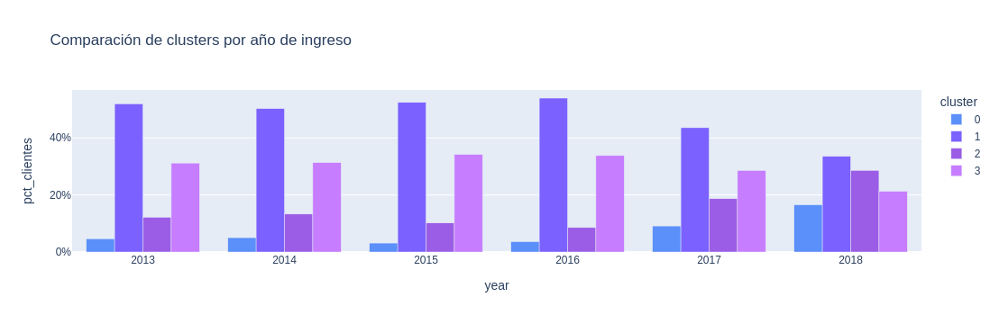

In [152]:
fig = px.bar(
    cluster_year_long,
    x='year',
    y='pct_clientes',
    color='cluster',
    barmode='group',
    color_discrete_sequence=[
        '#5B8FF9',
        '#7B61FF',
        '#9B5DE5',
        '#C77DFF'
    ],
    title='Comparación de clusters por año de ingreso'
)

fig.update_layout(
    yaxis_tickformat='.0%'
)

fig.show()

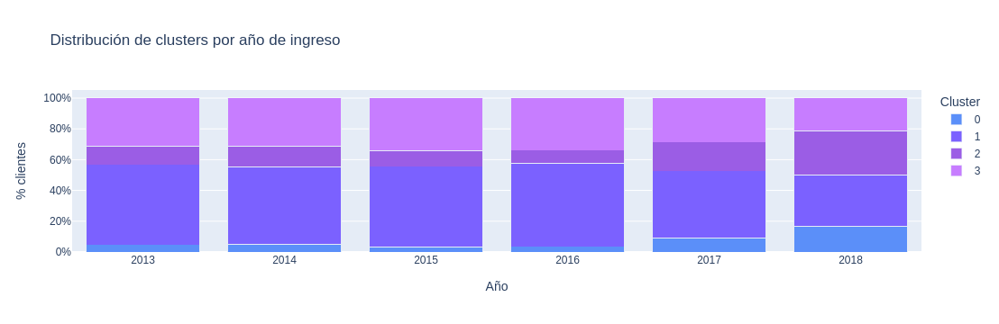

In [153]:
fig = px.bar(
    cluster_year_long,
    x='year',
    y='pct_clientes',
    color='cluster',
    barmode='stack',
    color_discrete_sequence=[
        '#5B8FF9',
        '#7B61FF',
        '#9B5DE5',
        '#C77DFF'
    ],
    title='Distribución de clusters por año de ingreso',
    labels={
        'pct_clientes': '% clientes',
        'year': 'Año',
        'cluster': 'Cluster'
    }
)

fig.update_layout(
    yaxis_tickformat='.0%'
)

fig.show()

## Perfilamiento de clusters — Gaussian Mixture Models (GMM)

A partir de la segmentación realizada mediante Gaussian Mixture Models (GMM) se identificaron cuatro grupos de clientes con diferencias principalmente relacionadas con su nivel de gasto, frecuencia de compra e interacción con promociones.

En términos generales, variables demográficas como edad e ingreso promedio no muestran diferencias suficientemente marcadas como para explicar por sí mismas la segmentación. Por ello, los clusters parecen estar definidos principalmente por patrones de comportamiento comercial y respuesta a campañas promocionales.

---

### Cluster 0 — Clientes frecuentes con alta interacción promocional

- Representa aproximadamente el 18% de los clientes.
- Presenta altas tasas de visualización de ofertas, especialmente mediante canales móviles y web.
- Aunque interactúan constantemente con promociones, mantienen niveles moderados de gasto y ticket promedio.

Este grupo corresponde a clientes activos y recurrentes que suelen revisar promociones con frecuencia, pero cuyo nivel de consumo es relativamente menor respecto a otros segmentos.

---

### Cluster 1 — Clientes de alto valor y alta conversión

- Representa cerca del 29% de los clientes.
- Mantiene altos niveles de gasto total, ticket promedio y número de transacciones.
- Presenta una de las mejores tasas de finalización de ofertas después de visualizarlas.

Este segmento puede considerarse uno de los perfiles comerciales más valiosos, ya que combina consumo elevado con una fuerte respuesta a campañas promocionales.

---

### Cluster 2 — Clientes masivos de alto consumo

- Corresponde aproximadamente al 45% de los registros, siendo el grupo más grande.
- Presenta niveles de gasto y frecuencia de compra muy similares al Cluster 1.
- Aunque sus tasas de conversión son ligeramente menores, mantiene una actividad comercial alta y constante.

Este grupo representa la base principal de clientes de la plataforma. Debido a su tamaño y comportamiento de compra, concentra gran parte de la actividad transaccional observada.

---

### Cluster 3 — Clientes de baja actividad comercial

- Representa aproximadamente el 9% de los clientes.
- Presenta el menor gasto promedio, menor ticket y menor número de transacciones.
- A pesar de visualizar promociones, prácticamente no completa ofertas.

Este segmento parece estar conformado por clientes de baja participación comercial o baja sensibilidad promocional, mostrando poca respuesta efectiva ante campañas y promociones.

---

# Conclusiones

La segmentación obtenida mediante GMM permitió identificar grupos de clientes con comportamientos diferenciados en términos de consumo e interacción con promociones.

Los clusters 1 y 2 concentran a los clientes de mayor valor comercial, caracterizados por altos niveles de gasto, mayor frecuencia de compra y mejor respuesta a campañas promocionales. Particularmente, el Cluster 2 destaca por concentrar cerca de la mitad de los clientes analizados, convirtiéndose en el segmento más representativo de la muestra.

Por otro lado, los clusters 0 y 3 agrupan clientes con menor nivel de consumo. Sin embargo, mientras el Cluster 0 mantiene una alta interacción con promociones y canales digitales, el Cluster 3 presenta una respuesta comercial considerablemente menor, incluso cuando visualiza ofertas.

Finalmente, las visualizaciones obtenidas mediante PCA y t-SNE respaldan la existencia de estructuras diferenciadas dentro de los datos. Aunque GMM presenta un mayor grado de solapamiento entre grupos respecto a KMeans, los segmentos identificados mantienen patrones de comportamiento claramente diferenciados y comercialmente interpretables.

# Bitácora de uso de IA

Durante el desarrollo de la práctica se utilizó inteligencia artificial como herramienta de apoyo técnico y metodológico para estructurar el análisis, validar decisiones y mejorar la presentación de resultados.

La IA apoyó principalmente en:

- Preparación y transformación de datos provenientes de `profile`, `portfolio` y `transcript`.
- Modelos para tratamiento de valores nulos y atípicos.
- Visualizaciones con t-SNE.
- Evaluador secundario de modelos de clustering como KMeans y GMM.
- Presentación de perfilamiento de clusters desde una perspectiva de negocio.
- Construcción de un dashboard ejecutivo en HTML con gráficos interactivos de Plotly y diseño tipo *tech dashboard*.

Aunque la IA ayudó a acelerar tareas de programación, redacción e interpretación visual, todas las decisiones finales sobre limpieza, modelado, segmentación y conclusiones fueron revisadas y ajustadas manualmente.